# Effect of factors on Youtube Trend Videos in Different Country 
    
    - Analysis of given features of dataset as well as custom features created using given variable for indepth trend effect

- By Ujjwal Bisht

- Sec 'E'


    - GOAL -> To interpret the effect of factors on trendiness of Videos


# IMPORT LIBRRARIES


In [177]:
suppressWarnings({
    library(tidyverse)

    library(ggplot2)
    library(gridExtra)

    library(corrplot)
    library(igraph)

    library(cowplot)
    library(gridExtra)

    library(skimr)

    library(tm)
    library(SnowballC)

    library(tidytext)
    library(stringr)

    library(dplyr)
    library(lubridate)

    library(ggthemes)
    library(plotly)

})


### LOAD DATA


In [2]:
India <- read_csv("/kaggle/input/countryanalysis/Indiavideos.csv", show_col_types = FALSE)
Cannada <- read_csv("/kaggle/input/countryanalysis/Canadavideos.csv", show_col_types = FALSE)
Japan <- read_csv("/kaggle/input/countryanalysis/Japanvideos.csv", show_col_type = FALSE)
Mexico <- read_csv("/kaggle/input/countryanalysis/Mexicovideos.csv", show_col_type = FALSE)
France <- read_csv("/kaggle/input/countryanalysis/Francevideos.csv", show_col_type = FALSE)
Russia <- read_csv("/kaggle/input/countryanalysis/Russiavideos.csv", show_col_type = FALSE)
UnitedState <- read_csv("/kaggle/input/countryanalysis/Unitedstatevideos.csv", show_col_type = FALSE)
GreatBritain <- read_csv("/kaggle/input/countryanalysis/GreatBritainvideos.csv", show_col_type = FALSE)
Germany <- read_csv("/kaggle/input/countryanalysis/Germanyvideos.csv", show_col_type = FALSE)


Warning message:
“One or more parsing issues, call `problems()` on your data frame for details,
e.g.:
  dat <- vroom(...)
  problems(dat)”
Warning message:
“One or more parsing issues, call `problems()` on your data frame for details,
e.g.:
  dat <- vroom(...)
  problems(dat)”


# **BASIC STATICAL ANALYSIS (Getting Overview Of Data)**

In [3]:
# Creating list of country names for code ease
list <- c("India", "Japan", "Mexico", "France", "Russia", "UnitedState", "GreatBritain", "Cannada", "Germany")

## Dimension of Dataset

In [4]:
# Dimension of data 

Get_Dimension <- function(list) {
    for (name in list) {
        country <-name 
        data <- get(paste(name, sep = ""))
        print(country)
        print(paste0("Dataset Dimension :",dim(data)))
    }
}

Get_Dimension(list)

[1] "India"
[1] "Dataset Dimension :37352" "Dataset Dimension :16"   
[1] "Japan"
[1] "Dataset Dimension :20523" "Dataset Dimension :16"   
[1] "Mexico"
[1] "Dataset Dimension :40451" "Dataset Dimension :16"   
[1] "France"
[1] "Dataset Dimension :40724" "Dataset Dimension :16"   
[1] "Russia"
[1] "Dataset Dimension :40739" "Dataset Dimension :16"   
[1] "UnitedState"
[1] "Dataset Dimension :7998" "Dataset Dimension :11"  
[1] "GreatBritain"
[1] "Dataset Dimension :7995" "Dataset Dimension :11"  
[1] "Cannada"
[1] "Dataset Dimension :40881" "Dataset Dimension :16"   
[1] "Germany"
[1] "Dataset Dimension :40840" "Dataset Dimension :16"   


## Number of Features

In [5]:
# Checking for features in each country
GetDetails <- function(list) {
    for (name in list) {
        data <- get(paste(name, sep = ""))
        x <- colnames(data)
        print(name)
        print(paste("Features Count :", length(x)))
        print(x)
        message()
    }
}

GetDetails(list)

[1] "India"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


[1] "Japan"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


[1] "Mexico"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


[1] "France"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


[1] "Russia"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


[1] "UnitedState"
[1] "Features Count : 11"
 [1] "video_id"       "title"          "channel_title"  "category_id"   
 [5] "tags"           "views"          "likes"          "dislikes"      
 [9] "comment_total"  "thumbnail_link" "date"          


[1] "GreatBritain"
[1] "Features Count : 11"
 [1] "video_id"       "title"          "channel_title"  "category_id"   
 [5] "tags"           "views"          "likes"          "dislikes"      
 [9] "comment_total"  "thumbnail_link" "date"          


[1] "Cannada"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


[1] "Germany"
[1] "Features Count : 16"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"           


### Getting info about elements for Each country

In [6]:
# Define a function to extract the dataset information

GetInfo <- function(dataset) {
    info <- list()
    info$dim <- dim(dataset)
    info$head <- head(dataset)
    info$str <- capture.output(summary(dataset))
    info$summary <- summary(dataset)
    return(info)
}

# Apply the function to all datasets and store the results in a list

India.info <- GetInfo(India)
Japan.info <- GetInfo(Japan)
Mexico.info <- GetInfo(Mexico)
France.info <- GetInfo(France)
Russia.info <- GetInfo(Russia)
UnitedState.info <- GetInfo(UnitedState)
GreatBritain.info <- GetInfo(GreatBritain)
Canada.info <- GetInfo(Cannada)
Germany.info <- GetInfo(Germany)


In [7]:
# Collected Info of India
India.info

$dim
[1] 37352    16

$head
# A tibble: 6 × 16
  video_id    trending_date title  channel_title category_id publish_time       
  <chr>       <chr>         <chr>  <chr>               <dbl> <dttm>             
1 kzwfHumJyYc 17.14.11      Sharr… Lokdhun Punj…           1 2017-11-12 12:20:39
2 zUZ1z7FwLc8 17.14.11      पीरिय… HJ NEWS                25 2017-11-13 05:43:56
3 10L1hZ9qa58 17.14.11      Styli… TFPC                   24 2017-11-12 15:48:08
4 N1vE8iiEg64 17.14.11      Eruma… Eruma Saani            23 2017-11-12 07:08:48
5 kJzGH0PVQHQ 17.14.11      why S… Filmylooks             24 2017-11-13 01:14:16
6 il_pSa5l98w 17.14.11      MCA (… Dil Raju               24 2017-11-10 04:29:50
# ℹ 10 more variables: tags <chr>, views <dbl>, likes <dbl>, dislikes <dbl>,
#   comment_count <dbl>, thumbnail_link <chr>, comments_disabled <lgl>,
#   ratings_disabled <lgl>, video_error_or_removed <lgl>, description <chr>

$str
 [1] "   video_id         trending_date         title           channel_ti

- NOTE

  - Almost 7 out of 9 countries have same 16 features except for United State and Great Britain with 11 Features

  - We handle 2 countries with less features seperately


In [8]:
# List out top 5 rows 
head(India)

video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description
<chr>,<chr>,<chr>,<chr>,<dbl>,<dttm>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>,<lgl>,<lgl>,<chr>
kzwfHumJyYc,17.14.11,Sharry Mann: Cute Munda ( Song Teaser) | Parmish Verma | Releasing on 17 November,Lokdhun Punjabi,1,2017-11-12 12:20:39,"sharry mann|""sharry mann new song""|""sharry mann cute munda""|""sharry mann latest song""|""sharry mann punjabi song 2017""|""parmish verma""|""parmish verma new song""|""parmish verma sharry mann""|""parmish verma sharry mann new song""|""parmish verma cute munda""|""new punjabi song 2017""|""punjabi song 2017""|""parmish verma new song 2017""|""parmish verma latest song 2017""|""punjabi songs 2017""",1096327,33966,798,882,https://i.ytimg.com/vi/kzwfHumJyYc/default.jpg,FALSE,FALSE,FALSE,"Presenting Sharry Mann latest Punjabi Song Cute Munda Teaser . The music of new punjabi song is given by Gift Rulers while lyrics are penned by Zaildar Pargat Singh. The video is directed by Parmish Verma. \nEnjoy and stay connected with us!! \n\nSong : Cute Munda\nSinger : Sharry Mann\nStarring : Sharry Mann, Rumman & Parmish Verma\nMusic : Gift Rulers\nLyrics : Zaildar Pargat Singh\nConcept, Screenplay & Direction : Parmish Verma\nOnline Promotions : Gold Media\nCopyright: Lokdhun\n\nFull Song Releasing on 17th November\n\n\nFor more new Punjabi songs, latest Punjabi videos, funny Punjabi comedy scenes and new Punjabi movies, subscribe our channel - http://goo.gl/NnoXVB\n\n\nLike us on Facebook - https://www.facebook.com/LokdhunPunjabiOfficial/\nFollow us on Twitter - https://twitter.com/lokdhunpunjabi\nFollow us on Instagram - https://www.instagram.com/lokdhunpunjabi\nVisit us on https://www.lokdhun.com"
zUZ1z7FwLc8,17.14.11,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दंग रह जायेंगे",HJ NEWS,25,2017-11-13 05:43:56,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर दंग रह जायेंगे""|""latest news""|""today news""|""news""|""breaking news""|""current news""|""world news""|""hj news updates""|""bollywood updates""|""news channel in hindi""|""entertainment news""|""merrage""|""love""|""break up""|""perideus time""|""pragenent girl""|""baby born""",590101,735,904,0,https://i.ytimg.com/vi/zUZ1z7FwLc8/default.jpg,TRUE,FALSE,FALSE,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दंग रह जायेंगे \n\nWatch this video :- https://youtu.be/zUZ1z7FwLc8\n\nHere is the secret of the death of PCS wife Namrata on February 16, 2017, still persisted after 9 months. In the case, the relatives of the deceased had accused the in-laws of torture against dowry, after which the police sent the accused husband and mother-in-law and sent them to jail.\n\nThe mother of the deceased Kiran said, Humility was my little daughter, she was preparing to become an IAS. Then there was a relation of dedication from a matrimonial website. We were watching the relationship for our eldest daughter, I liked the humility. \n- We did not want that little sister's marriage to be a big one before, but humility itself was refusing marriage, but Mother of Divine took it to the center. Dipartan was PCS, so we also agreed for marriage. . ''\nDeepa's mother Anuradha had said that humility could continue her studies even after marriage. On this condition she was ready for marriage, both of them were married on June 10, 2015.\n- Cajun Sister Chitra said, The sister was emotionally attached to the lamp, there were many things that she used to share with me, but Deep used to torture her for dowry.\n- During the periods, the lamp beat him on the stomach and back. Sister came home and asked me to massage the stomach and back. She used to tell that Deep struck a lot, massage it. \n- I had advised sister to take the Divorce, but she did not want to break the relationship.\n\nSubscribe Us for Latest News & Updates ► https://goo.gl/K8pjDQ\n\nStay Connected with Us :\n\nFollow Us On

### Features

- "video_id": Unique identifier for each video.

- "trending_date": Date when the video appeared in the trending list.

- "title": Title of the video.

- "channel_title": YouTube channel name.

- "category_id": The category ID of the video, representing the content category to which it belongs (e.g., music, gaming, comedy, etc.). Given in Integer...

- "publish_time": The date and time when the video was published on YouTube.

- "tags": The tags associated with the video, which are keywords used to describe its content.
-
- "views": The number of views the video has received.

- "likes": The number of likes received by the video.

- "dislikes": The number of dislikes received by the video.

- "comment_count": The number of comments posted on the video.

- "thumbnail_link": The URL link to the thumbnail image of the video.

- "comments_disabled": A binary indicator (True or False) specifying whether comments are disabled for the video.

- "ratings_disabled": A binary indicator (True or False) specifying whether ratings (likes/dislikes) are disabled for the video.

- "video_error_or_removed": A binary indicator (True or False) specifying whether the video encountered an error or was removed.

- "description": The description provided for the video


In [9]:
# Cheking for missing Values

check_missing_values_all <- function() {
  for (country in list) {
    data <- get(paste(country, sep = ""))
    missing_values <- is.na(data)
    missing_counts <- colSums(missing_values)
    print(paste("Missing values in", country, "dataset:"))
    print(missing_counts)
    message(" ")
  }
}

# function call
check_missing_values_all()


[1] "Missing values in India dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                   561 


[1] "Missing values in Japan dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                  2124 


[1] "Missing values in Mexico dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                  4224 


[1] "Missing values in France dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                  2913 


[1] "Missing values in Russia dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                  2464 


[1] "Missing values in UnitedState dataset:"
      video_id          title  channel_title    category_id           tags 
             0              0              0              0              0 
         views          likes       dislikes  comment_total thumbnail_link 
             0              0              0              0              0 
          date 
             0 


[1] "Missing values in GreatBritain dataset:"
      video_id          title  channel_title    category_id           tags 
             0              0              0              0              0 
         views          likes       dislikes  comment_total thumbnail_link 
             0              0              0              0              0 
          date 
             0 


[1] "Missing values in Cannada dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                  1296 


[1] "Missing values in Germany dataset:"
              video_id          trending_date                  title 
                     0                      0                      0 
         channel_title            category_id           publish_time 
                     0                      0                      0 
                  tags                  views                  likes 
                     0                      0                      0 
              dislikes          comment_count         thumbnail_link 
                     0                      0                      0 
     comments_disabled       ratings_disabled video_error_or_removed 
                     0                      0                      0 
           description 
                  1552 


- Every country have missing data of description.

- We further handle it on language processing


# Preprocessing 
    - Title Length
    
    - Custom Trend Date
    
    - Like Ratio
    
    - Convert year month format
    
    - Convert in minute hour second
    
    - Like Ratio 
    
    - Dislike Percentage
    
    - Convert Hour and Day
    
    - Trend Score


In [10]:
# Function to Covert id to Genre 

# Categories
YouTube_Categories= c('Film & Animation','Autos & Vehicles','Music','Pets & Animals','Sports','Travel & Events','Gaming','People & Blogs','Comedy','Entertainment','News & Politics','Howto & Style','Education','Science & Technology','Nonprofits & Activism','Movies','Shows')
# IDS
ID =c(1,2,10,15,17,19,20,22,23,24,25,26,27,28,29,30,43)	

# Create a data frame with the ID and YouTube category data
df <- data.frame(ID = ID, YouTube_Categories = YouTube_Categories)


# Create a function to convert the ID to genre
convert_id_to_genre <- function(id) {
  index <- match(id,ID)
  genre <- YouTube_Categories[index]
  return(genre)
}

In [11]:
# Extracting Title Length

Add_Custom_Features <- function(data) {
    # Adding title length
    data$title_length <- sapply(data$title, nchar)

    # Convert date time forat
    # Convert it year month date format
    data$custom_trend_date <- as.POSIXct(data$trending_date, format = "%y.%d.%m")
    # Converting in minutes hour second format
    data$custom_publish_time <- as.POSIXct(data$publish_time, format = "%Y-%m-%dT%H:%M:%S.%z")

    # Like ratio
    data$like_ratio <- data$likes / data$views

    # Dislike percentage
    data$dislike_percentage <- data$dislikes / (data$dislikes + data$likes)

    # extracting hours and day from publish time
    data$hour_of_day <- hour(data$custom_publish_time)
    data$day_of_week <- wday(data$custom_publish_time, label = TRUE)

    # Convert id to genre
    data$category_id<-sapply(data$category_id, convert_id_to_genre)
    
    # calcuating trend score
    data$trend_score <- ((data$views - mean(data$views))/sd(data$views)) + ((data$likes - mean(data$likes))/sd(data$likes)) +((data$comment_count - mean(data$comment_count))/sd(data$comment_count))
    
    
    # return data
    return(data)
}

India.new <- Add_Custom_Features(India)
Japan.new <- Add_Custom_Features(Japan)
Mexico.new <- Add_Custom_Features(Mexico)
Russia.new <- Add_Custom_Features(Russia)
France.new <- Add_Custom_Features(France)
Cannada.new <- Add_Custom_Features(Cannada)
Germany.new <- Add_Custom_Features(Germany)


In [12]:
# New country list for easy dataset config 
new_list <- c("India.new", "Japan.new", "Mexico.new", "France.new", "Russia.new", "Cannada.new", "Germany.new")

In [13]:
# Listing new features

# Listing feature function

GetDetails<- function(country_list){
    for(country in country_list){
        data <- get(paste(country, sep = ""))
        name <- sub("\\.new$", "", country)
        print(paste(name," have ",length(colnames(data)),"features"))
        print(colnames(data))
        message(" ")
    }
}

# New features added to frame

GetDetails(new_list)


[1] "India  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


[1] "Japan  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


[1] "Mexico  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


[1] "France  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


[1] "Russia  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


[1] "Cannada  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


[1] "Germany  have  24 features"
 [1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           


In [14]:
# Checking for converted Genre and their Frequencies in each country

Get_category_Frequency<- function(country_list){
    for(country in country_list){
        data <- get(paste(country, sep = ""))
        name <- sub("\\.new$", "", country)
        print(paste("Country :",name))
        print(table(data$category_id))
    }
}

# Call function
Get_category_Frequency(new_list)


[1] "Country : India"

     Autos & Vehicles                Comedy             Education 
                   72                  3429                  1227 
        Entertainment      Film & Animation                Gaming 
                16712                  1658                    66 
        Howto & Style                Movies                 Music 
                  845                    16                  3858 
      News & Politics Nonprofits & Activism        People & Blogs 
                 5241                   105                  2624 
       Pets & Animals  Science & Technology                 Shows 
                    3                   552                   205 
               Sports       Travel & Events 
                  731                     8 
[1] "Country : Japan"

     Autos & Vehicles                Comedy             Education 
                  280                   743                   112 
        Entertainment      Film & Animation                G

In [15]:

text = sample(India.new$description, size=4000)
# Percentage of questions with question marks
qmarks <- mean(grepl("\\?", text)) * 100

# Percentage of questions with math tag
math <- mean(grepl("\\[math\\]", text)) * 100

# Percentage of questions with full stop mark
fullstop <- mean(grepl("\\.", text)) * 100

# Percentage of questions with first capital
capital_first <- mean(grepl("^[[:upper:]]", text)) * 100

# Percentage of questions with capitals
capitals <- mean(grepl("[A-Z]", text)) * 100

# Percentage of questions with numbers
numbers <- mean(grepl("[0-9]", text)) * 100

# Print the results
cat(paste("Description with question marks:", sprintf("%.2f%%", qmarks), "\n"))
cat(paste("Description with [math] tags:", sprintf("%.2f%%", math), "\n"))
cat(paste("Description with full stops:", sprintf("%.2f%%", fullstop), "\n"))
cat(paste("Description with capitalised first letters:", sprintf("%.2f%%", capital_first), "\n"))
cat(paste("Description with capital letters:", sprintf("%.2f%%", capitals), "\n"))
cat(paste("Description with numbers:", sprintf("%.2f%%", numbers), "\n"))


Description with question marks: 27.68% 
Description with [math] tags: 0.00% 
Description with full stops: 92.55% 
Description with capitalised first letters: 77.22% 
Description with capital letters: 96.43% 
Description with numbers: 79.83% 


# EXPLORATORY DATA ANALYSIS

### Analyzing the trend of videos published by hour of the day in each country:

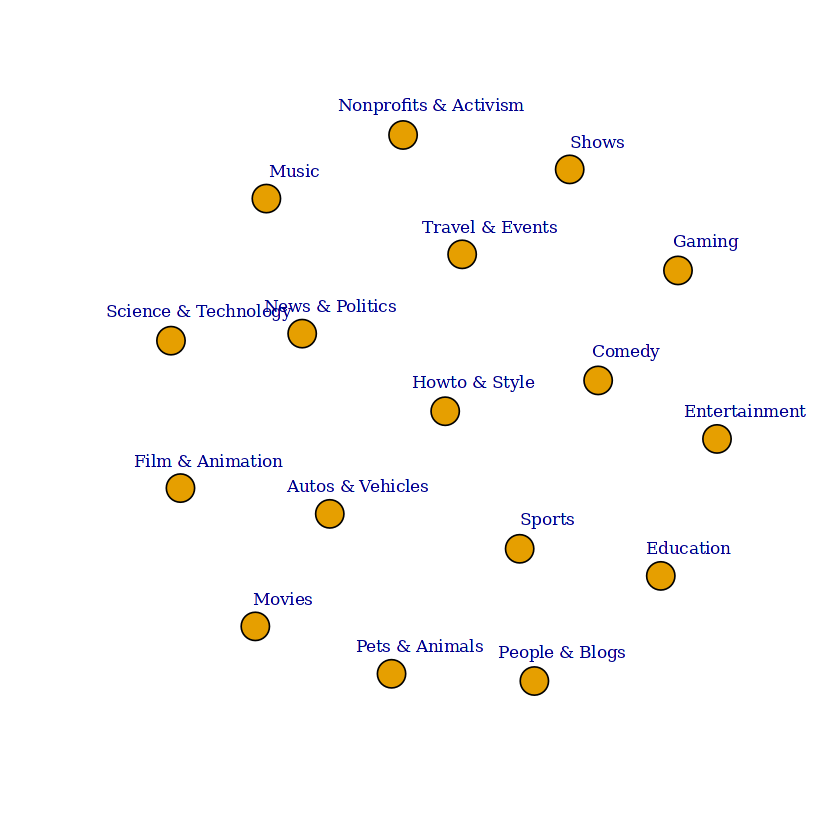

In [16]:
# Total Categories Available


# Get unique categories
categories <- unique(India.new$category_id)

# Create an empty directed graph
g <- graph.empty(n = length(categories), directed = TRUE)

# Add nodes to the graph
g <- set_vertex_attr(g, "name", value = categories)


# Plot the graph
plot(g, vertex.label = V(g)$name, vertex.size = 10, vertex.label.cex = 0.8, vertex.label.dist = 2)


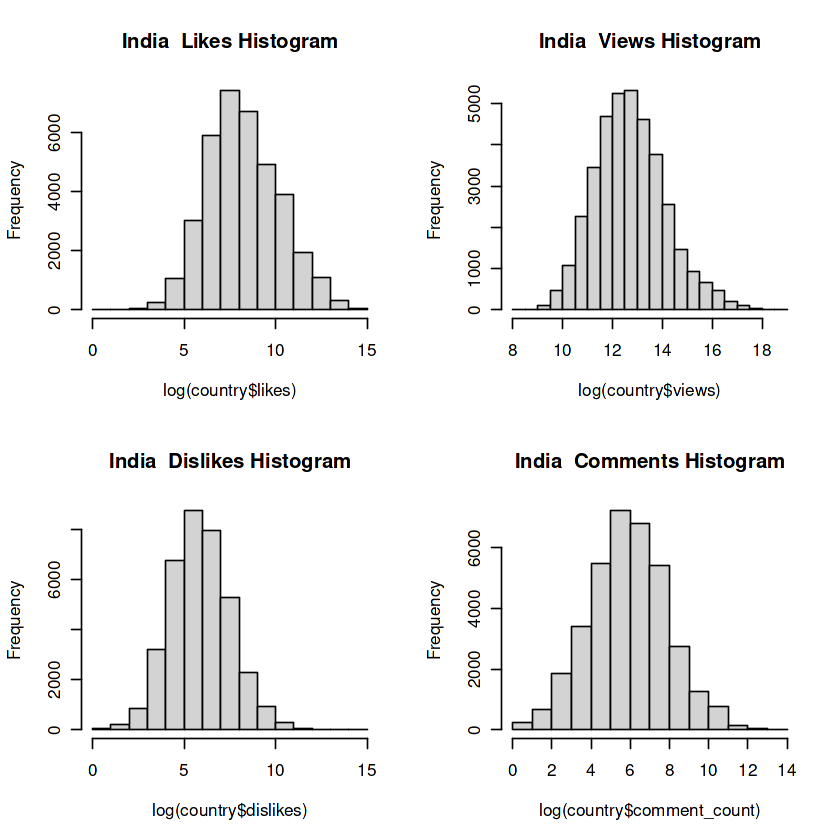

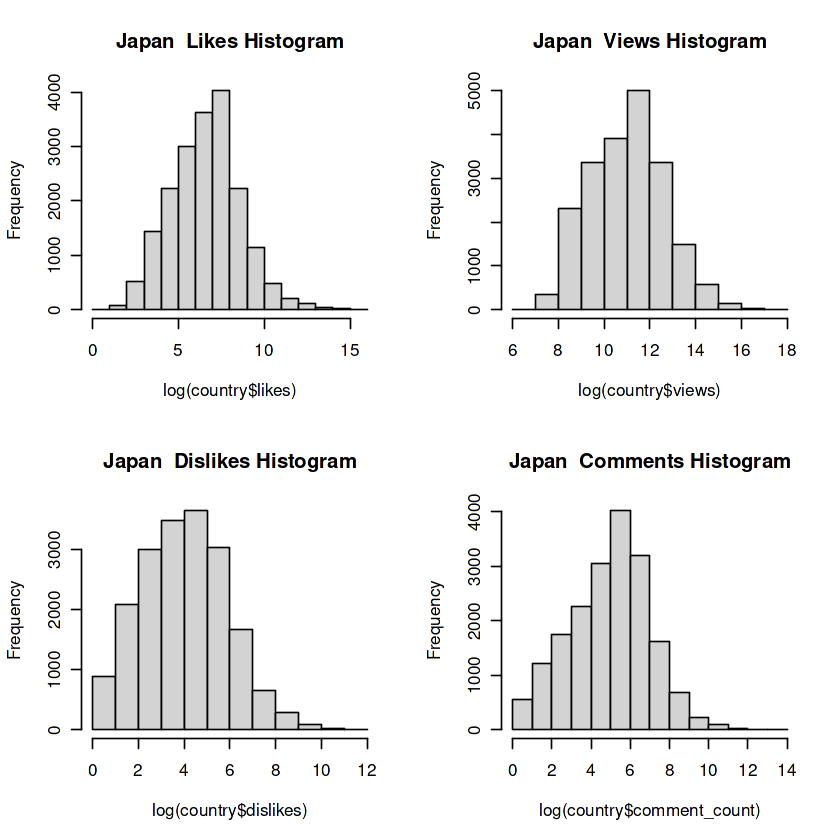

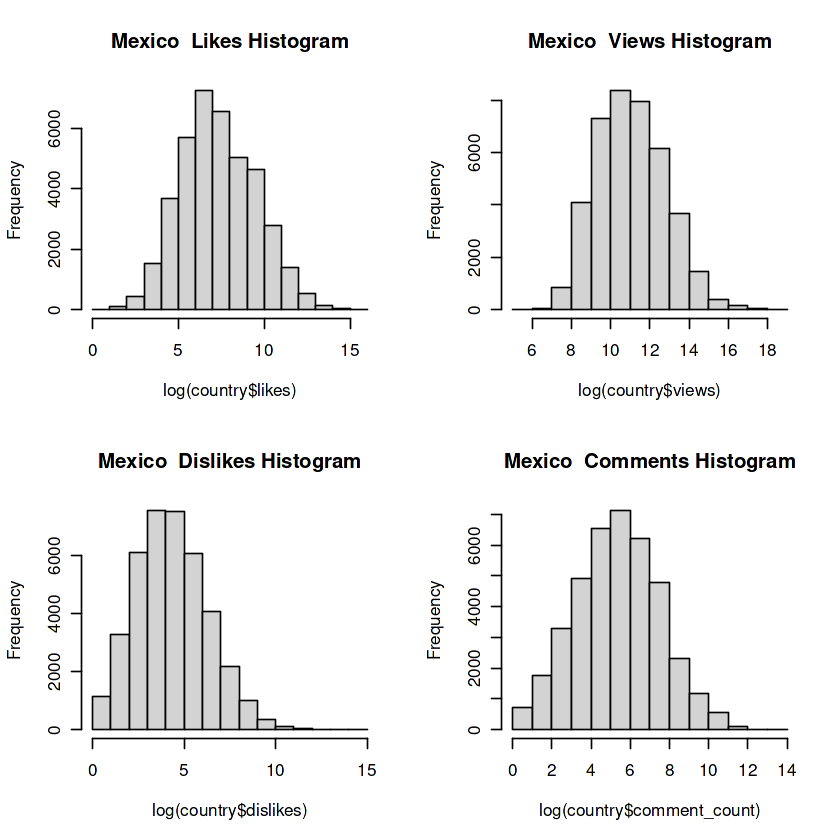

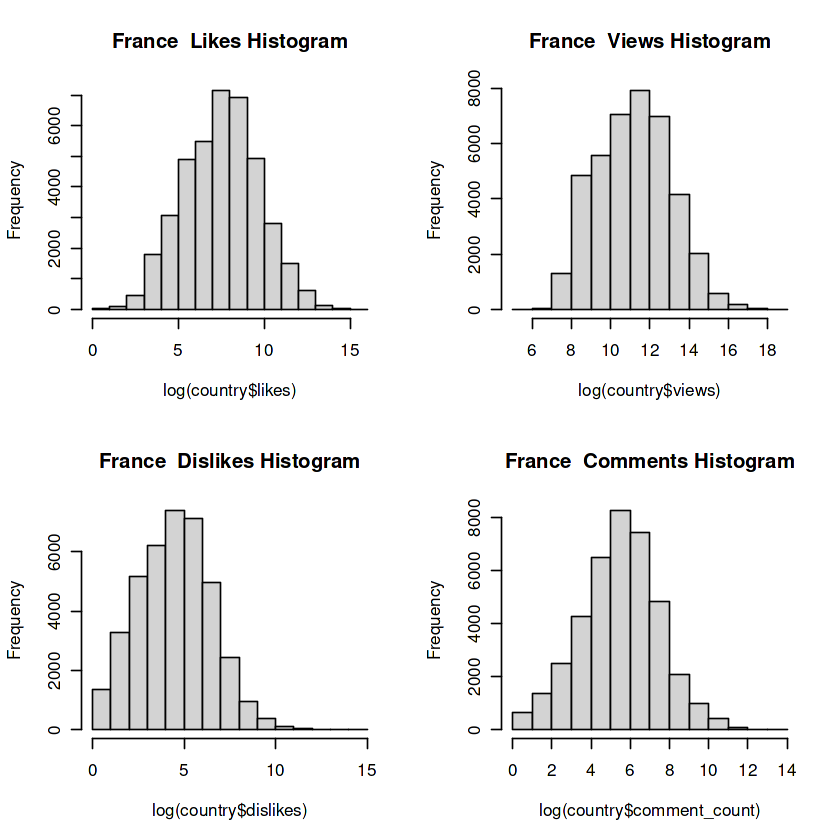

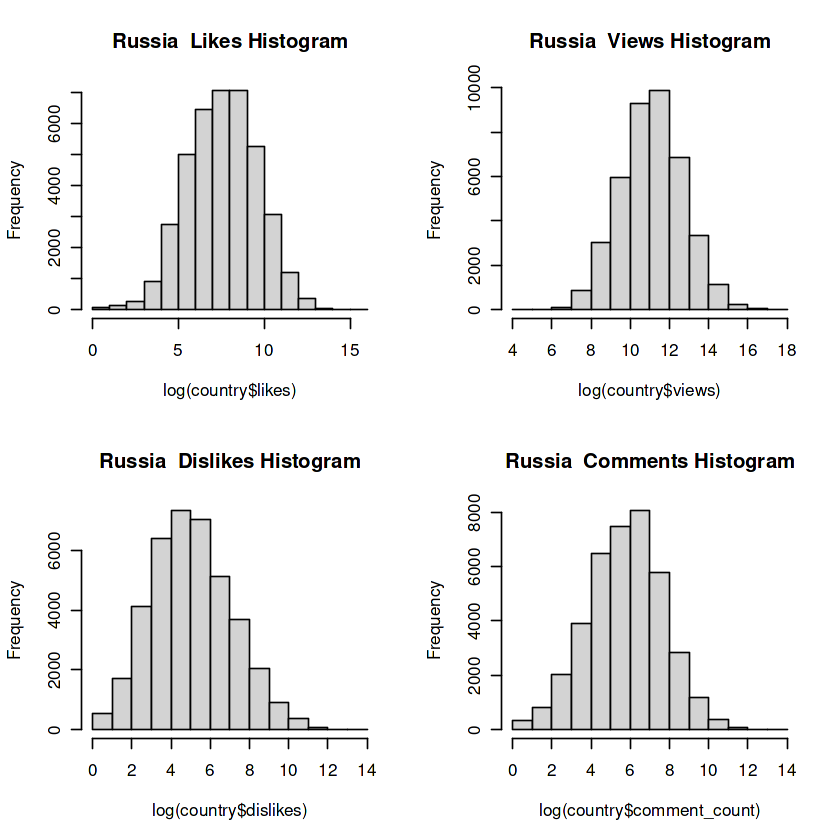

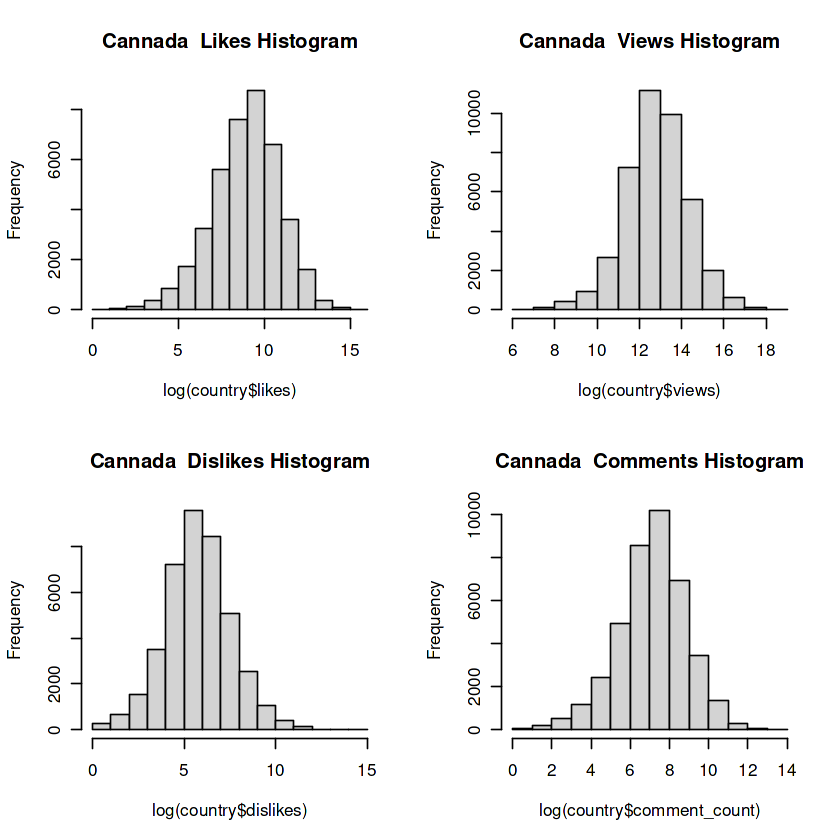

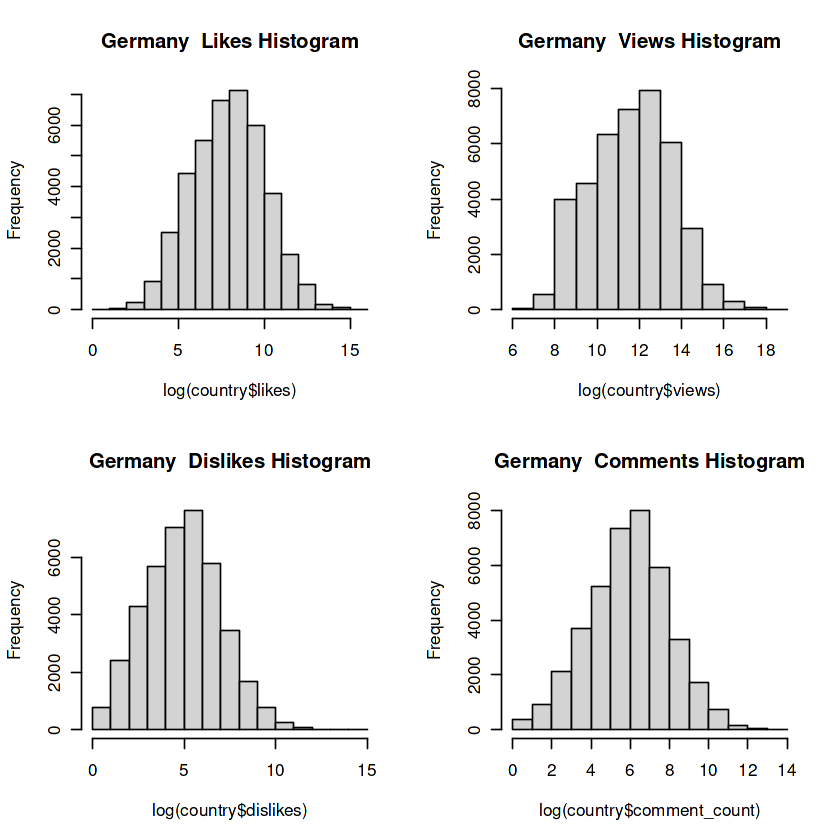

In [17]:
# Distribution of numerical features

par(mfrow = c(2,2))

Log_Numeric_Features<- function(country, name){
    hist(log(country$likes),main=paste(name," Likes Histogram"))
    hist(log(country$views),main=paste(name," Views Histogram"))
    hist(log(country$dislikes), main =paste(name," Dislikes Histogram"))
    hist(log(country$comment_count),main=paste(name," Comments Histogram"))
    message(" ")
}

 for (country in new_list) {
    data<-get(paste(country,sep=""))
    name<- sub("\\.new$", "", country)
    Log_Numeric_Features(data, name)
}


###  Trend of videos published by day hours

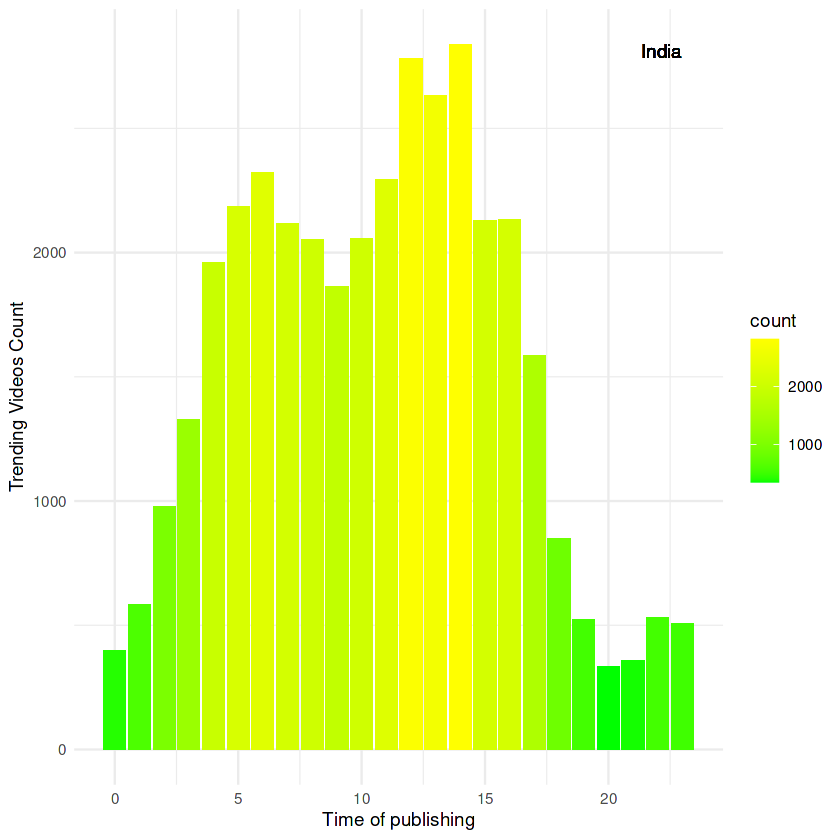

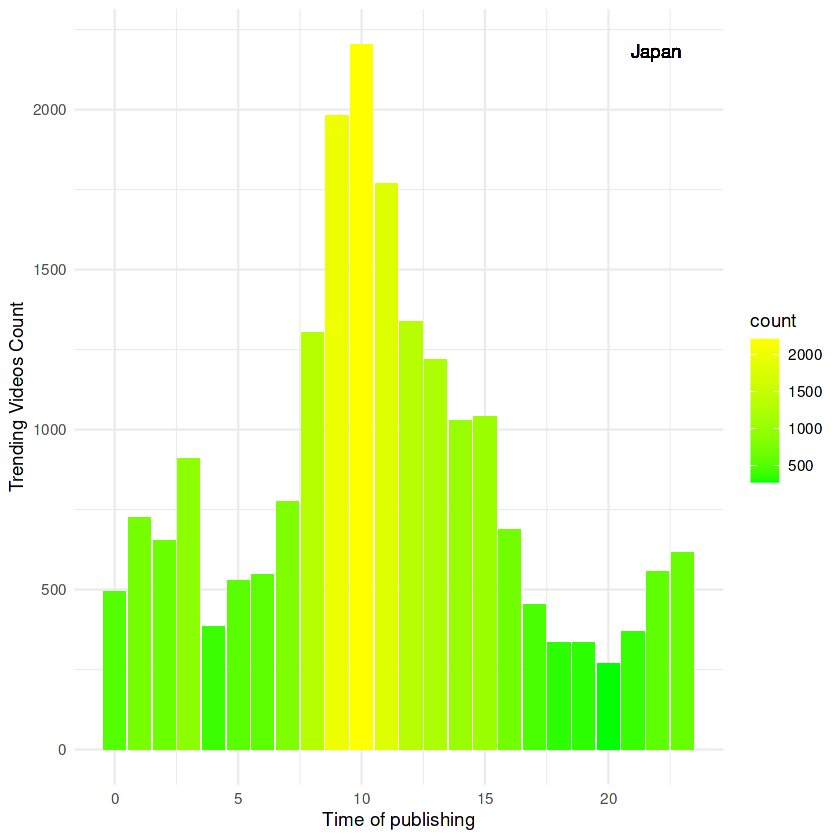

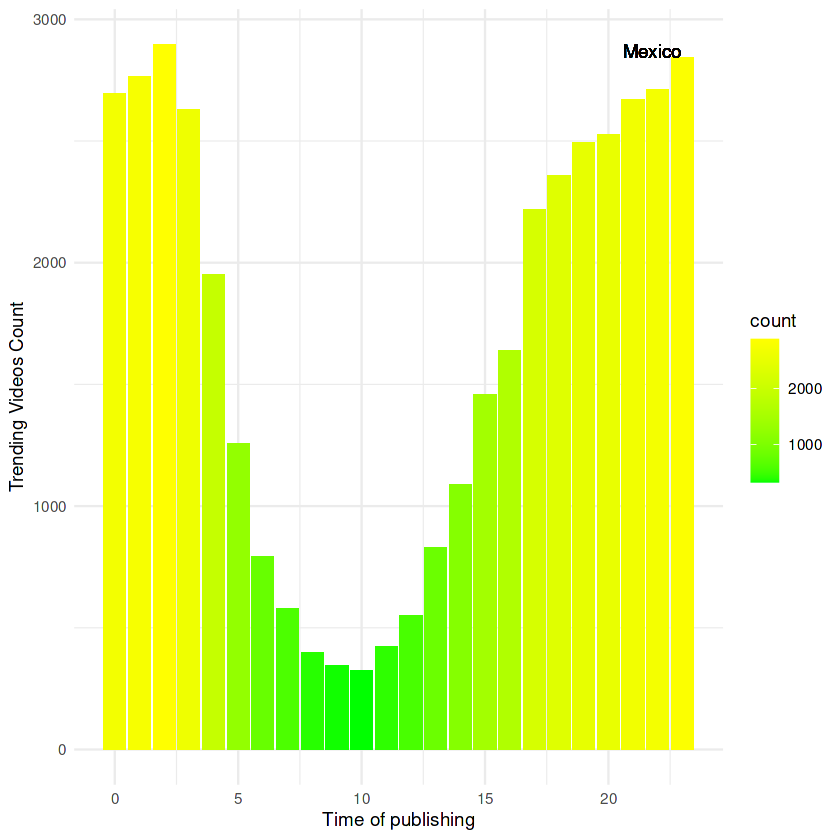

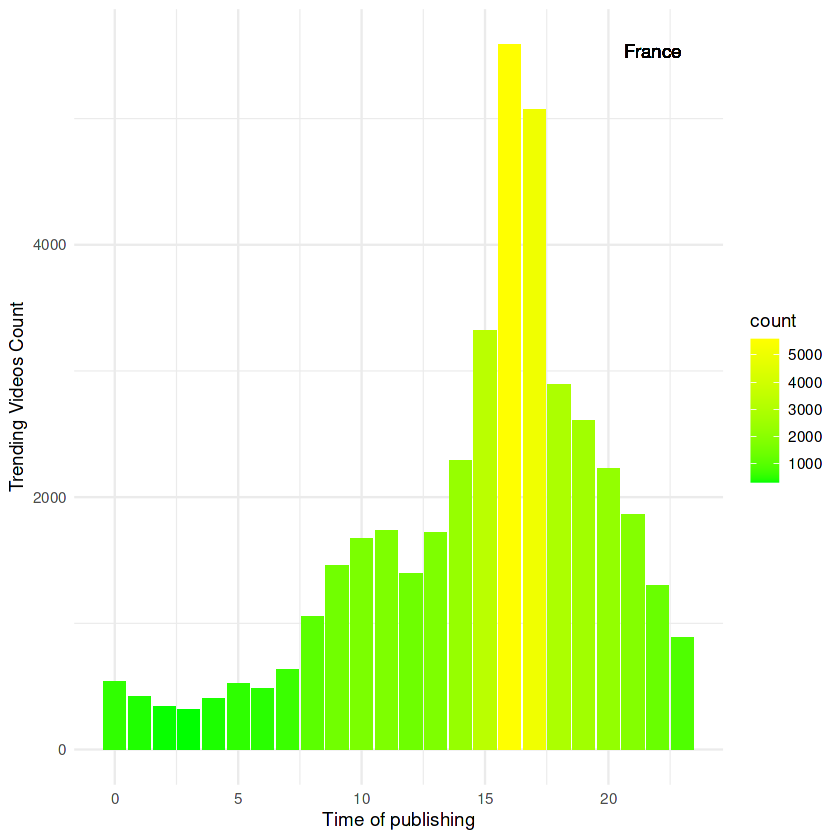

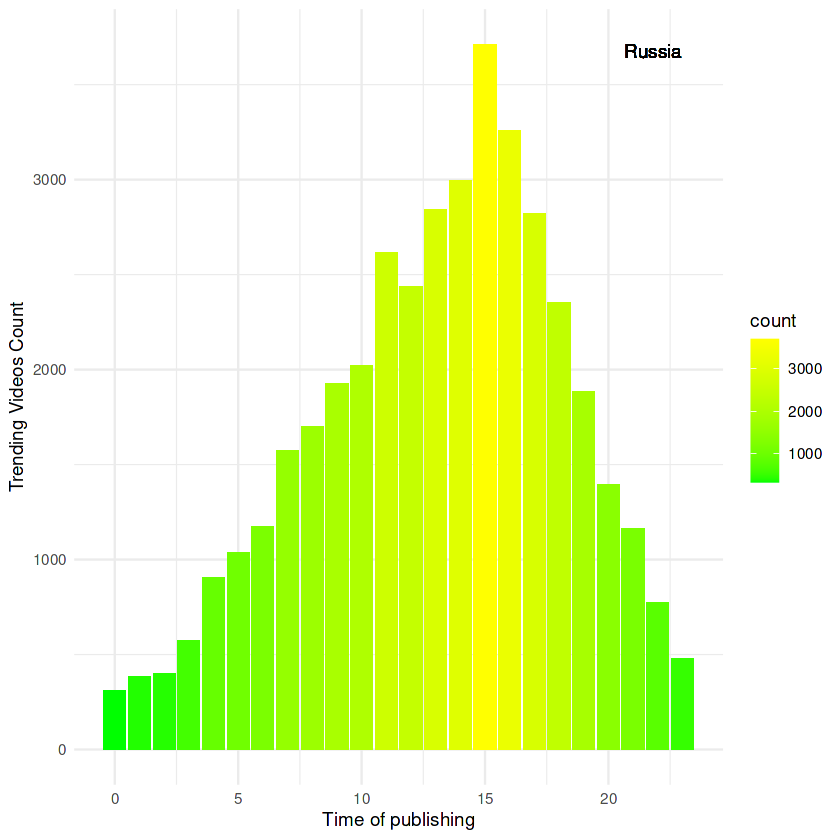

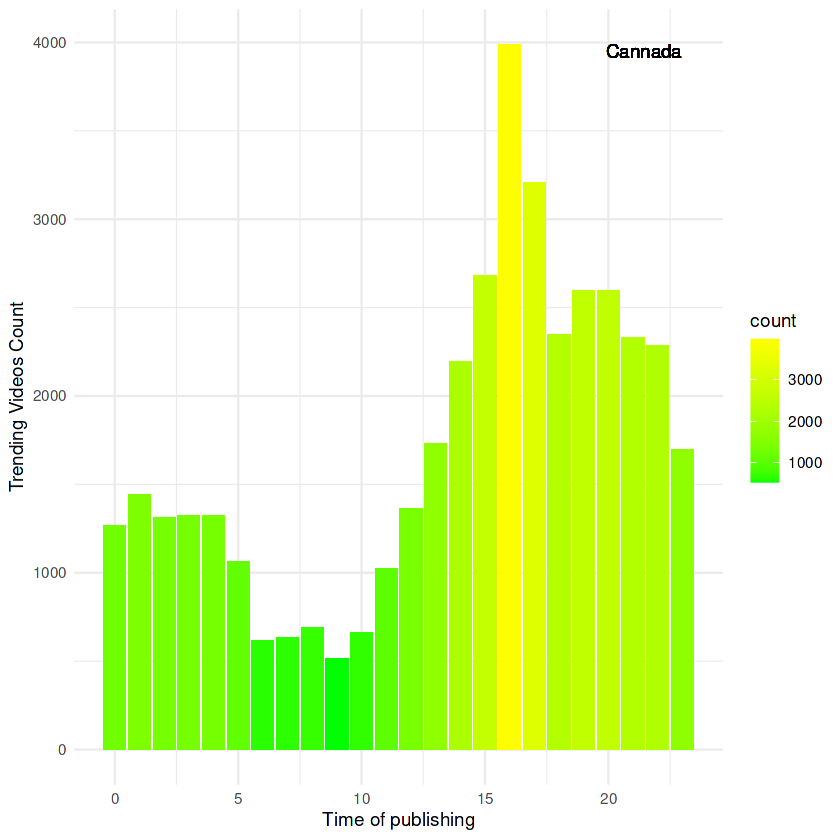

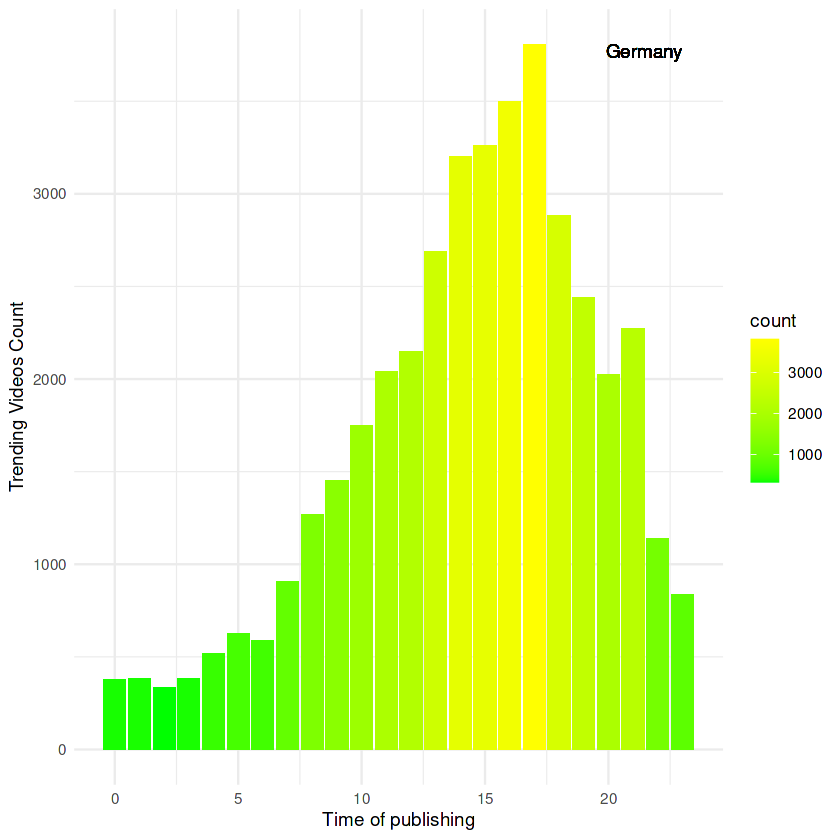

In [18]:
# Function 
par(mfrow =c(2,2))

VideosGotTrend <- function(list, delay = 10) {
  for (country in list) {
    data <- get(paste(country, sep = ""))
    name<- sub("\\.new$", "", country)
    publish_h <- table(data$hour_of_day)
    plot_data <- data.frame(hour = as.integer(names(publish_h)), count = as.integer(publish_h))
    p <- ggplot(plot_data, aes(x = hour, y = count, fill = count)) +
      geom_bar(stat = "identity") +
      scale_fill_gradient(low = "green", high = "yellow") +
      labs(x = "Time of publishing", y = "Trending Videos Count") +
      theme_minimal() +
      geom_text(aes(label = name), x = max(plot_data$hour), y = max(plot_data$count), hjust = 1, vjust = 1)  # Add country name as text in the plot
    
    print(p)
  }
}


# Function call
VideosGotTrend(new_list)


### Viral videos in each country

In [19]:
# Get Viral Videos

Viral_Videos_Listing <- function(list) {
        viral_videos <- list %>%
            arrange('trending_date') %>%
            select(Channel_Name = channel_title, title, category_id, Publish_Date = custom_trend_date)

        head(viral_videos)
}


# Popular Video of India
print("India Viral")
Viral_Videos_Listing(India.new)
message()

print("Cannada Viral")
#Popular of Cannada
Viral_Videos_Listing(Cannada.new)

message()
print("Japan Viral")
Viral_Videos_Listing(Japan.new)

[1] "India Viral"


Channel_Name,title,category_id,Publish_Date
<chr>,<chr>,<chr>,<dttm>
Lokdhun Punjabi,Sharry Mann: Cute Munda ( Song Teaser) | Parmish Verma | Releasing on 17 November,Film & Animation,2017-11-14
HJ NEWS,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दंग रह जायेंगे",News & Politics,2017-11-14
TFPC,Stylish Star Allu Arjun @ ChaySam Wedding Reception | TFPC,Entertainment,2017-11-14
Eruma Saani,Eruma Saani | Tamil vs English,Comedy,2017-11-14
Filmylooks,why Samantha became EMOTIONAL @ Samantha naga chaithanya marriage Reception | Filmylooks,Entertainment,2017-11-14
Dil Raju,"MCA (Middle Class Abbayi) TEASER - Nani,Sai Pallavi, Dil Raju, Devi Sri Prasad, Sriram Venu",Entertainment,2017-11-14


[1] "Cannada Viral"


Channel_Name,title,category_id,Publish_Date
<chr>,<chr>,<chr>,<dttm>
EminemVEVO,Eminem - Walk On Water (Audio) ft. Beyoncé,Music,2017-11-14
iDubbbzTV,PLUSH - Bad Unboxing Fan Mail,Comedy,2017-11-14
Rudy Mancuso,"Racist Superman | Rudy Mancuso, King Bach & Lele Pons",Comedy,2017-11-14
nigahiga,I Dare You: GOING BALD!?,Entertainment,2017-11-14
Ed Sheeran,Ed Sheeran - Perfect (Official Music Video),Music,2017-11-14
DramaAlert,Jake Paul Says Alissa Violet CHEATED with LOGAN PAUL! #DramaAlert Team 10 vs Martinez Twins!,News & Politics,2017-11-14


[1] "Japan Viral"


Channel_Name,title,category_id,Publish_Date
<chr>,<chr>,<chr>,<dttm>
時事通信映像センター,陸自ヘリ、垂直に落下＝路上の車が撮影,News & Politics,2018-02-07
神谷えりな Kamiya Erina 2,イッテQ お祭り男宮川×手越 巨大ブランコ②,Film & Animation,2018-02-07
SpaceX,Live Views of Starman,Science & Technology,2018-02-07
アシタノワダイ,東京ディズニーリゾートの元キャストが暴露した秘密5選,News & Politics,2018-02-07
シネマトゥデイ,榮倉奈々、衝撃の死んだふり！映画『家に帰ると妻が必ず死んだふりをしています。』特報,Film & Animation,2018-02-07
激白！！スーパー芸能チャンネル！！,有賀さつきさんの死因を元夫・和田圭が会見前に漏らし一同涙の嵐・・・,People & Blogs,2018-02-07


### Most Influential YouTube Creators

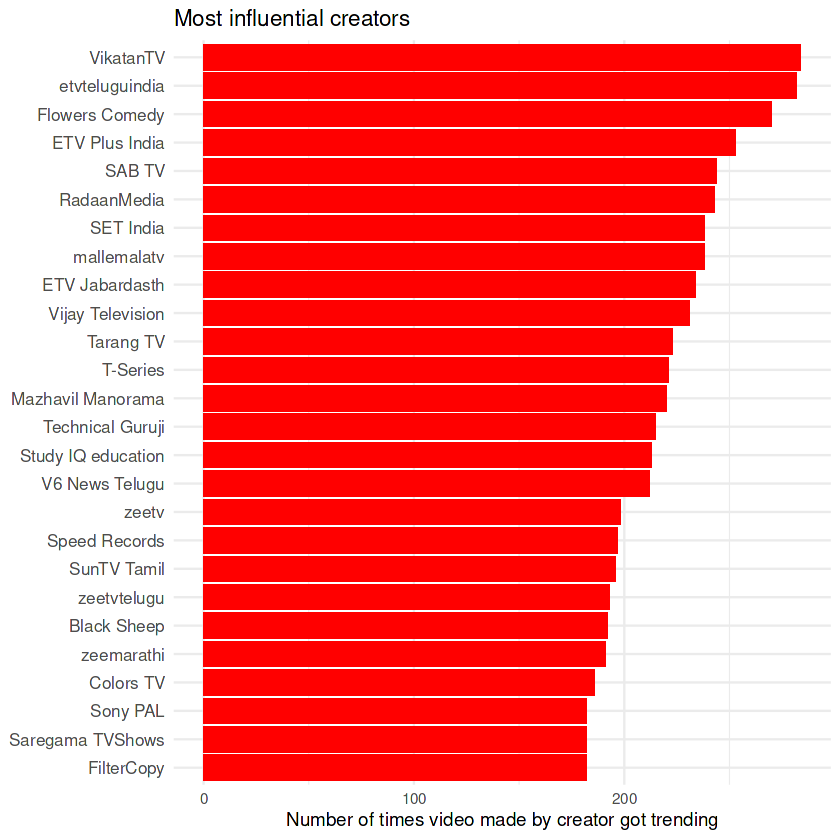

In [20]:
# Most influential creators


Influential_Character<- function(data){
  top_creators <- data %>%
  group_by(channel_title) %>%
  summarise(code_count = n()) %>%
  arrange(desc(code_count)) %>%
  slice_max(n = 25, order_by = code_count)
  
  plt <- ggplot(top_creators, aes(x = code_count, y = reorder(channel_title, code_count))) +
  geom_bar(stat = "identity", fill = 'red') +
  labs(x = "Number of times video made by creator got trending", y = NULL) +
  ggtitle("Most influential creators") +
  theme_minimal() +
  theme(axis.text.y = element_text(size = 10))

  plot(plt)
}

Influential_Character(India.new)

 ### Popularity of YouTube Video Categories

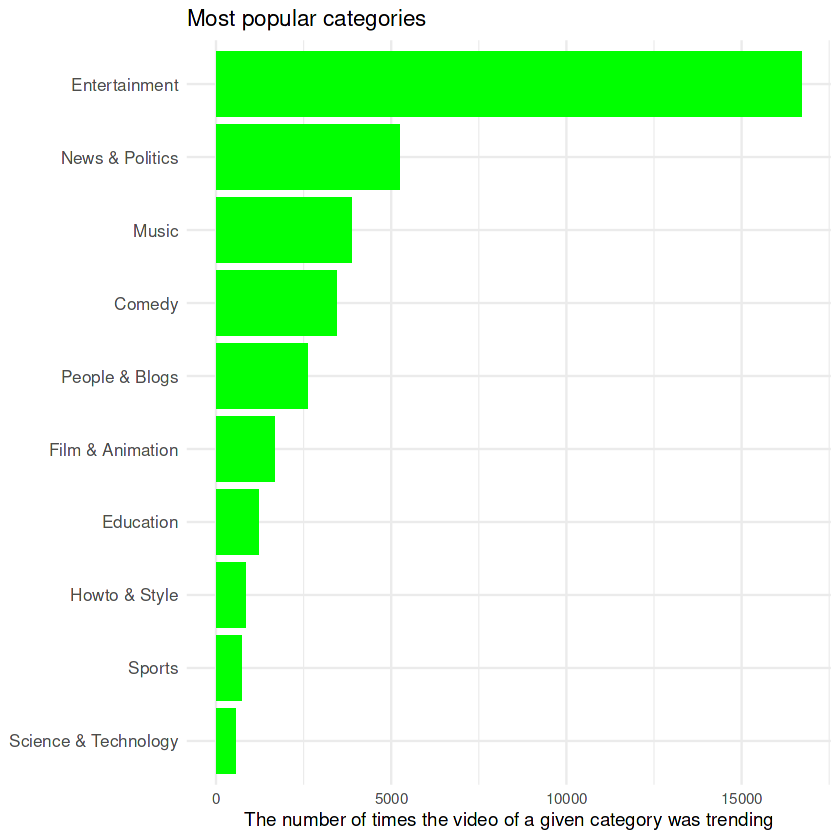

In [21]:
Top_Category <- function(data) {
  top_categories <- data %>%
    group_by(category_id) %>%
    summarise(code_count = n()) %>%
    arrange(desc(code_count)) %>%
    slice_max(n = 10, order_by = code_count)
  
  plt <- ggplot(top_categories, aes(x = code_count, y = reorder(category_id, code_count))) +
    geom_bar(stat = "identity", fill = 'green') +
    labs(x = "The number of times the video of a given category was trending", y = NULL) +
    ggtitle("Most popular categories") +
    theme_minimal() +
    theme(axis.text.y = element_text(size = 10))
  
  plot(plt)
}

Top_Category(India.new)

# Late Bloomers : Videos get trend after a certain time period

Warning message:
“'plotly::offline' is deprecated.
Use 'plot_ly' instead.
See help("Deprecated")”


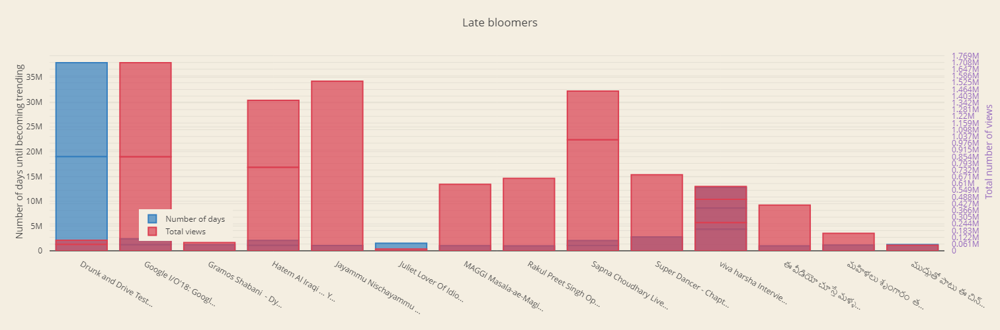

In [22]:
Get_LateBloomers <- function(data) {
  max_title_length <- 20
  number_of_late_bloomers <- 20
  data$time_to_trend <- as.integer(data$custom_trend_date - data$custom_publish_time)
  
  late_bloomers <- data[order(data$time_to_trend, decreasing = TRUE), ][1:number_of_late_bloomers, ]
  late_bloomers_title <- ifelse(nchar(late_bloomers$title) <= max_title_length, late_bloomers$title, paste(substr(late_bloomers$title, 1, max_title_length), "...", sep = ""))
  
  trace1 <- list(
    x = late_bloomers_title,
    y = late_bloomers$time_to_trend,
    name = 'Number of days',
    type = 'bar',
    marker = list(
      color = 'rgba(55, 128, 191, 0.7)',
      line = list(
        color = 'rgba(55, 128, 191, 1.0)',
        width = 2
      )
    )
  )
  
  trace2 <- list(
    x = late_bloomers_title,
    y = late_bloomers$views,
    name = 'Total views',
    type = 'bar',
    marker = list(
      color = 'rgba(219, 64, 82, 0.7)',
      line = list(
        color = 'rgba(219, 64, 82, 1.0)',
        width = 2
      )
    ),
    yaxis = 'y2'
  )
  
  data <- list(trace1, trace2)
  
  layout <- list(
    barmode = 'group',
    title = 'Late bloomers',
    width = 900,
    height = 500,
    margin = list(
      l = 75,
      r = 75,
      b = 120,
      t = 80,
      pad = 10
    ),
    paper_bgcolor = 'rgb(244, 238, 225)',
    plot_bgcolor = 'rgb(244, 238, 225)',
    yaxis = list(
      title = 'Number of days until becoming trending',
      anchor = 'x',
      rangemode = 'tozero'
    ),
    yaxis2 = list(
      title = 'Total number of views',
      titlefont = list(
        color = 'rgb(148, 103, 189)'
      ),
      tickfont = list(
        color = 'rgb(148, 103, 189)'
      ),
      overlaying = 'y',
      side = 'right',
      anchor = 'x',
      rangemode = 'tozero',
      dtick = 61000
    ),
    legend = list(x = 0.1, y = 0.05)
  )
  
  fig <- list(data = data, layout = layout)
  plotly::offline(plotly::plotly_build(fig))
}

Get_LateBloomers(India.new)


### Popularity with Dislikes (Bad publishment make it viral)

Warning message:
“'plotly::offline' is deprecated.
Use 'plot_ly' instead.
See help("Deprecated")”


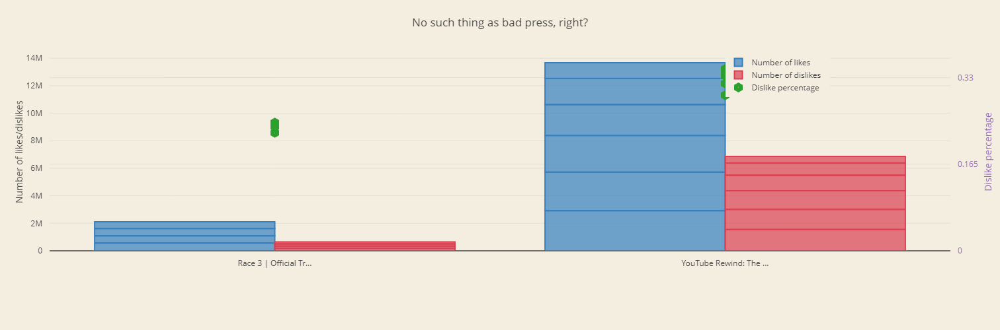

In [23]:
Popularity_By_Dislikes <- function(country) {
  max_title_length <- 20
  number_of_late_bloomers <- 10
  
  country$dislikes <- country$dislikes
  country$dislike_percentage <- country$dislikes / (country$dislikes + country$likes)
  
  most_disliked <- head(country[order(country$dislikes, decreasing = TRUE), ], number_of_late_bloomers)
  most_disliked_title <- ifelse(nchar(most_disliked$title) <= max_title_length, most_disliked$title, paste0(substr(most_disliked$title, 1, max_title_length), "..."))
  most_disliked_l_number <- most_disliked$likes
  most_disliked_dl_number <- most_disliked$dislikes
  most_disliked_dl_percentage <- most_disliked$dislike_percentage
  
  trace1 <- list(
    x = most_disliked_title,
    y = most_disliked_l_number,
    name = 'Number of likes',
    type = 'bar',
    marker = list(
      color = 'rgba(55, 128, 191, 0.7)',
      line = list(
        color = 'rgba(55, 128, 191, 1.0)',
        width = 2
      )
    )
  )
  
  trace2 <- list(
    x = most_disliked_title,
    y = most_disliked_dl_number,
    name = 'Number of dislikes',
    type = 'bar',
    marker = list(
      color = 'rgba(219, 64, 82, 0.7)',
      line = list(
        color = 'rgba(219, 64, 82, 1.0)',
        width = 2
      )
    )
  )
  
  trace3 <- list(
    x = most_disliked_title,
    y = most_disliked_dl_percentage,
    name = 'Dislike percentage',
    mode = 'markers',
    type = 'scatter',
    marker = list(
      symbol = "hexagon-dot",
      size = 15
    ),
    yaxis = 'y2'
  )
  
  data <- list(trace1, trace2, trace3)
  
  layout <- list(
    barmode = 'group',
    title = 'No such thing as bad press, right?',
    width = 900,
    height = 500,
    margin = list(
      l = 75,
      r = 75,
      b = 120,
      t = 80,
      pad = 10
    ),
    paper_bgcolor = 'rgb(244, 238, 225)',
    plot_bgcolor = 'rgb(244, 238, 225)',
    yaxis = list(
      title = 'Number of likes/dislikes',
      anchor = 'x',
      rangemode = 'tozero'
    ),
    yaxis2 = list(
      title = 'Dislike percentage',
      titlefont = list(
        color = 'rgb(148, 103, 189)'
      ),
      tickfont = list(
        color = 'rgb(148, 103, 189)'
      ),
      overlaying = 'y',
      side = 'right',
      anchor = 'x',
      rangemode = 'tozero',
      dtick = 0.165
    ),
    legend = list(x = 0.75, y = 1)
  )
  
  fig <- list(data = data, layout = layout)
  plotly::offline(plotly::plotly_build(fig))
}

Popularity_By_Dislikes(India.new)


### Distribution of Likes and Dislikes

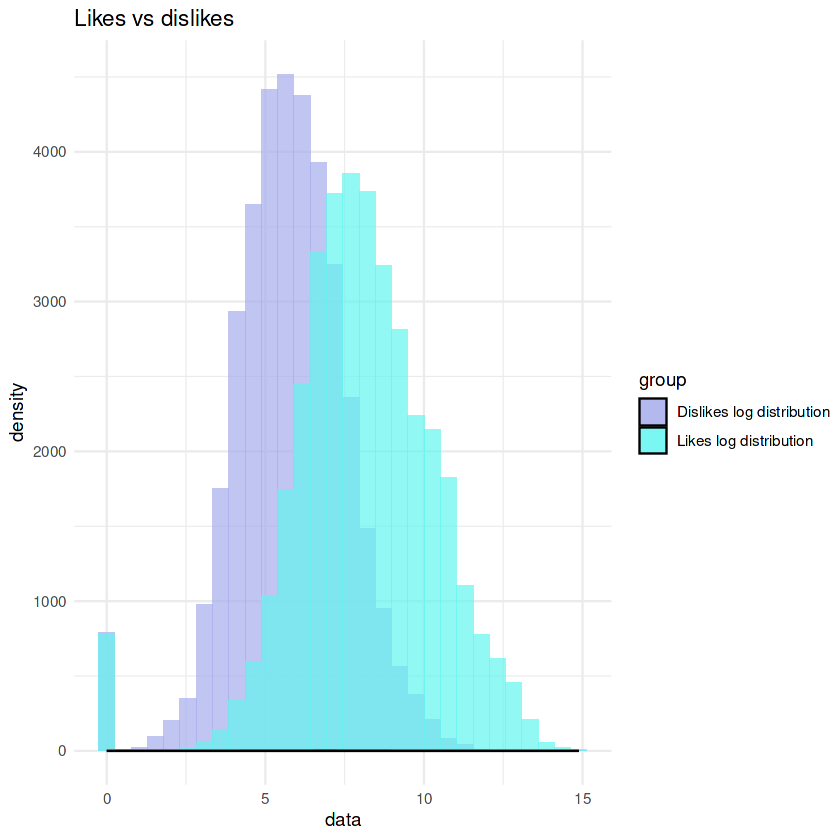

In [24]:
Likes_Dislikes_Distribution <- function(datafr) {
  datafr$likes_log <- log(datafr$likes + 1)
  datafr$dislikes_log <- log(datafr$dislikes + 1)
  
  # Create histogram data
  hist_data <- list(datafr$dislikes_log, datafr$likes_log)
  group_labels <- c('Dislikes log distribution', 'Likes log distribution')
  colors <- c('#A6ACEC', '#63F5EF')
  
  # Combine data into a data frame
  df <- data.frame(
    data = unlist(hist_data),
    group = rep(group_labels, lengths(hist_data))
  )
  
  # Create histogram and curve using ggplot2
  plot <- ggplot(df, aes(x = data, fill = group)) +
    geom_histogram(position = "identity", alpha = 0.7, bins = 30) +
    geom_density(alpha = 0.5) +
    scale_fill_manual(values = colors) +
    labs(title = "Likes vs dislikes") +
    theme_minimal()
  
  # Display the plot
  print(plot)
}

country = "India.new"

if (country %in% new_list) {
  data <- get(paste(country, sep = ""))
  name <- sub("\\.new$", "", country)
  Likes_Dislikes_Distribution(data)
}


### Channels which remove or delete videos

### Channel Titles Distribution

Warning message:
“'plotly::offline' is deprecated.
Use 'plot_ly' instead.
See help("Deprecated")”


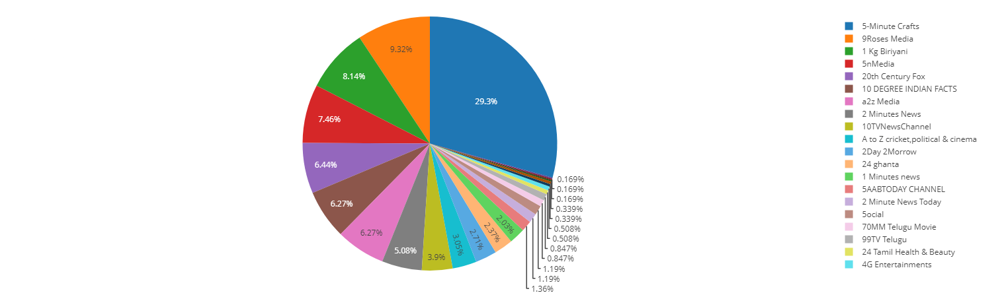

In [25]:
Make_Pie_Distribution<-function(data){
    # Compute channel_title counts
    temp <- as.data.frame(table(data$channel_title))
    colnames(temp) <- c("channel_title", "index")

    # Create pie chart using plotly
    pie_chart <- plot_ly(temp[1:25,], labels = ~channel_title, values = ~index, type = "pie")

    # Display the pie chart
    plotly::offline(plotly::plotly_build(pie_chart))
}

Make_Pie_Distribution(India.new)

### Publishing Trend By Weekdays

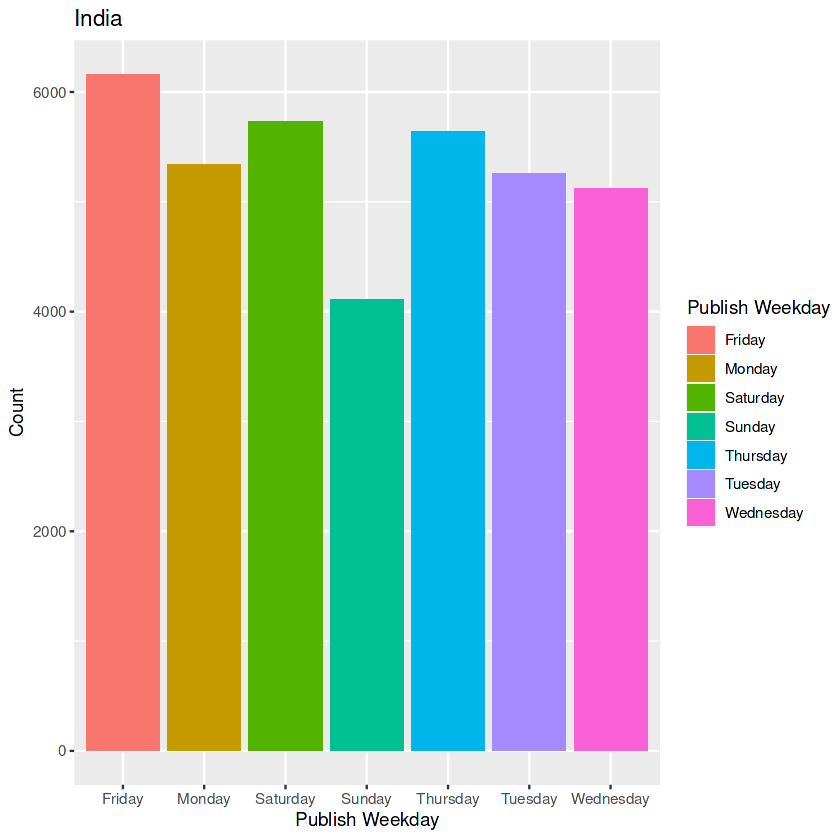

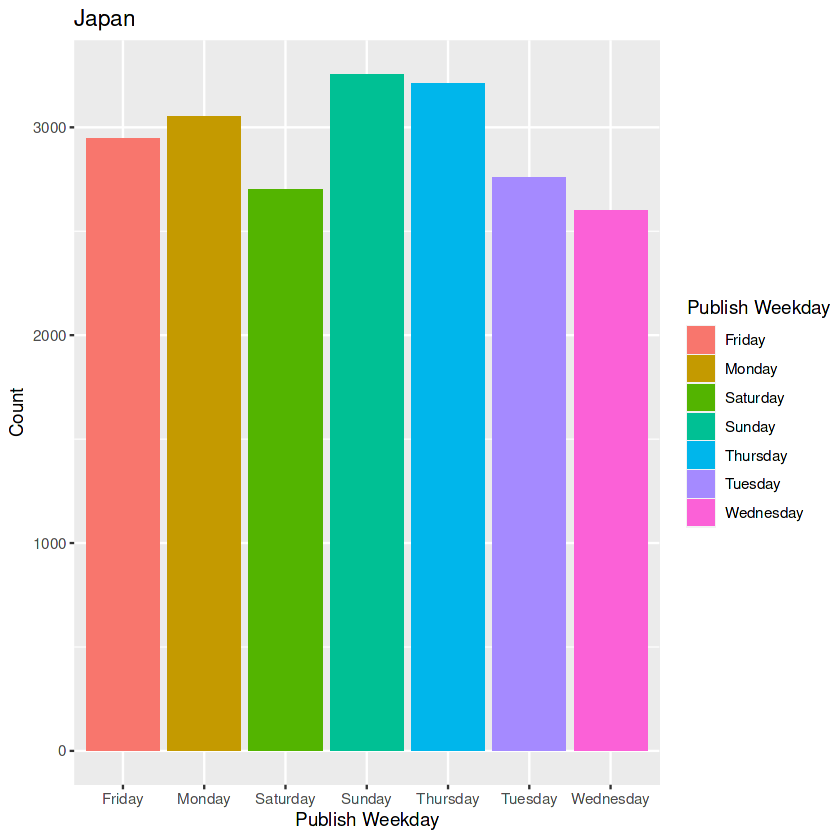

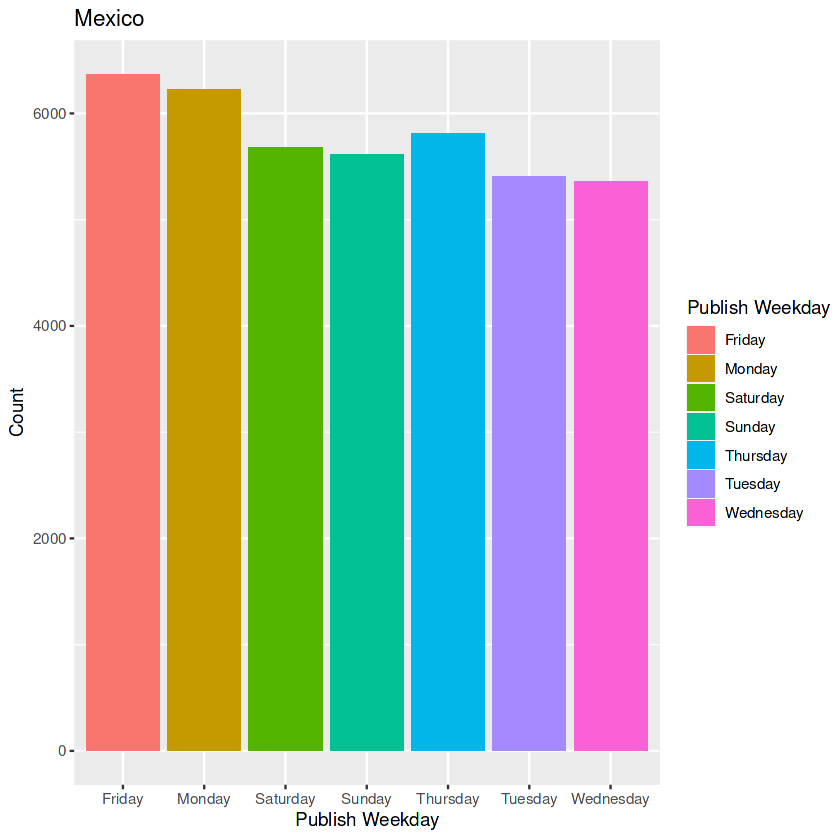

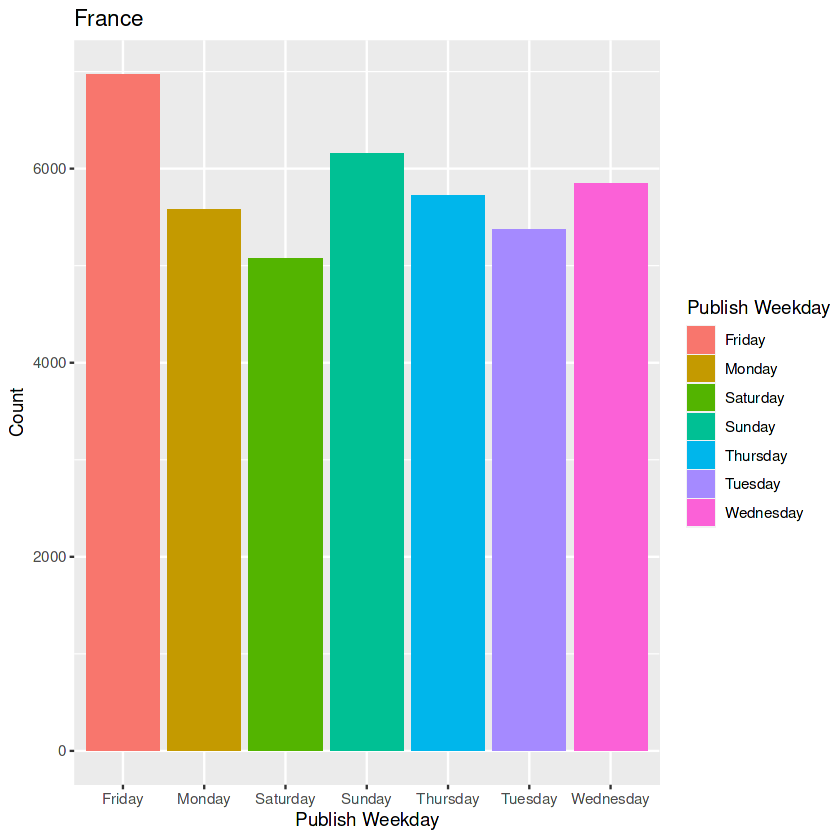

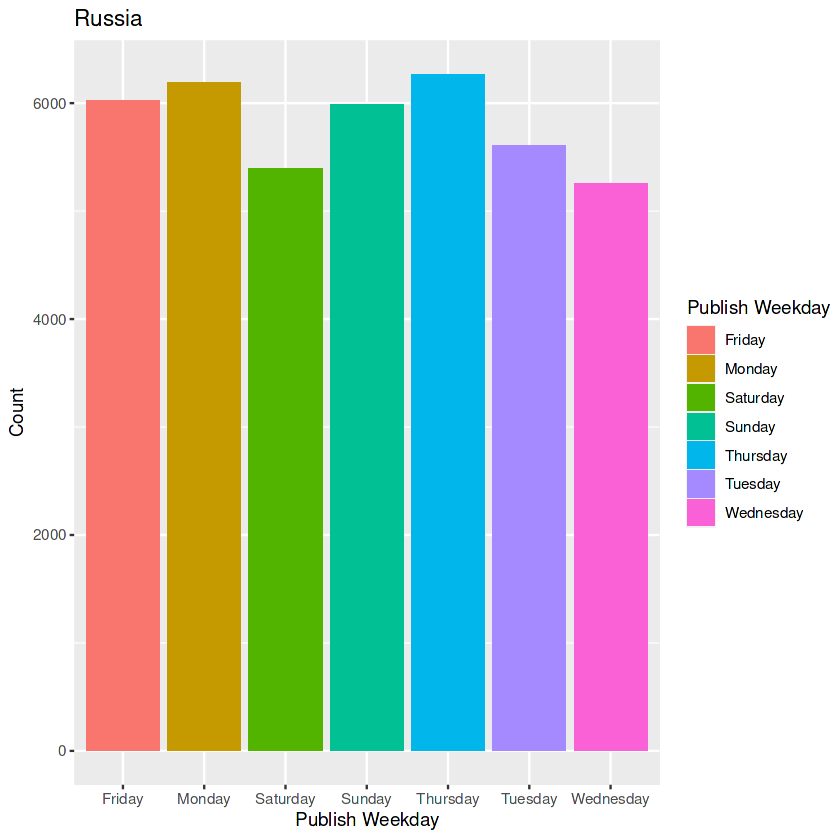

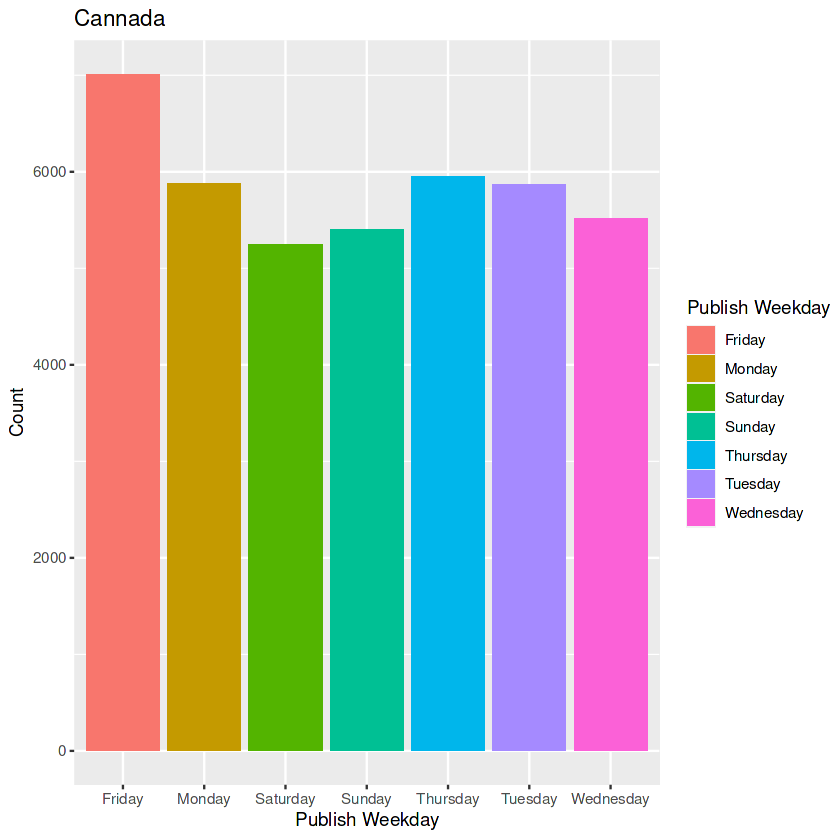

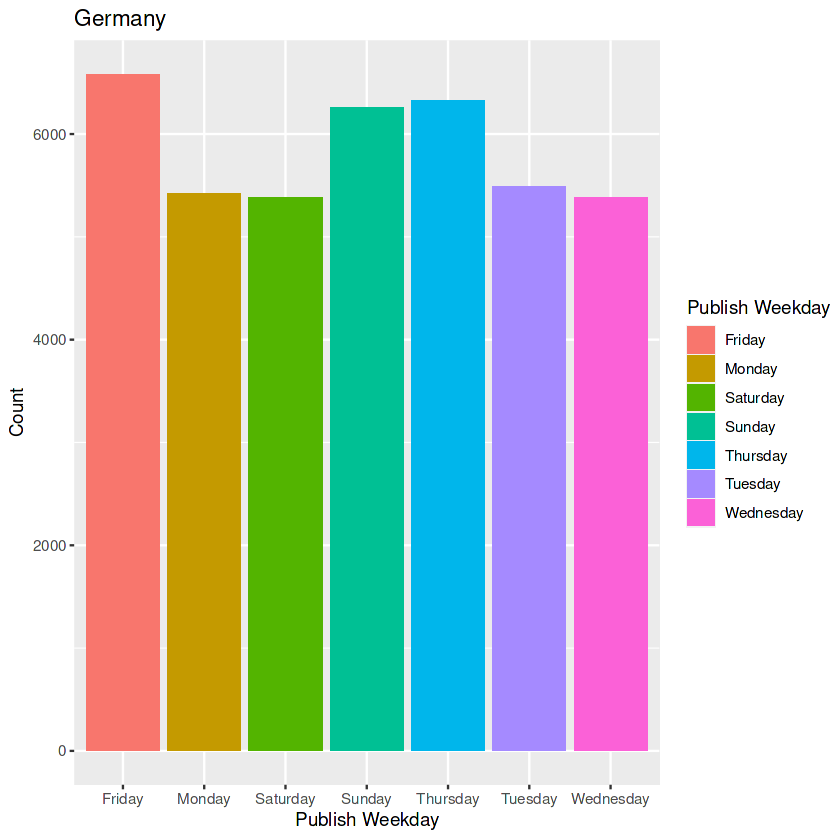

In [26]:
library(ggplot2)


create_weekday_plot <- function(data, country_name) {
  data$date <- as.Date.character(data$custom_publish_time)
  plot <- data %>%
    mutate(publish_weekday = weekdays(date)) %>%
    group_by(publish_weekday) %>%
    summarise(Count = n()) %>%
    ggplot(aes(x = publish_weekday, y = Count, fill = publish_weekday)) +
    geom_col() +
    labs(x = "Publish Weekday", y = "Count") +
    ggtitle(paste0(country_name)) +
    scale_fill_discrete(name = "Publish Weekday")
  
  plot(plot)
}

for (country in new_list) {
  data <- get(paste(country, sep = ""))
  name <- sub("\\.new$", "", country)
  create_weekday_plot(data, name)
}



### Relationship between  Publishing Hour and Trend Score

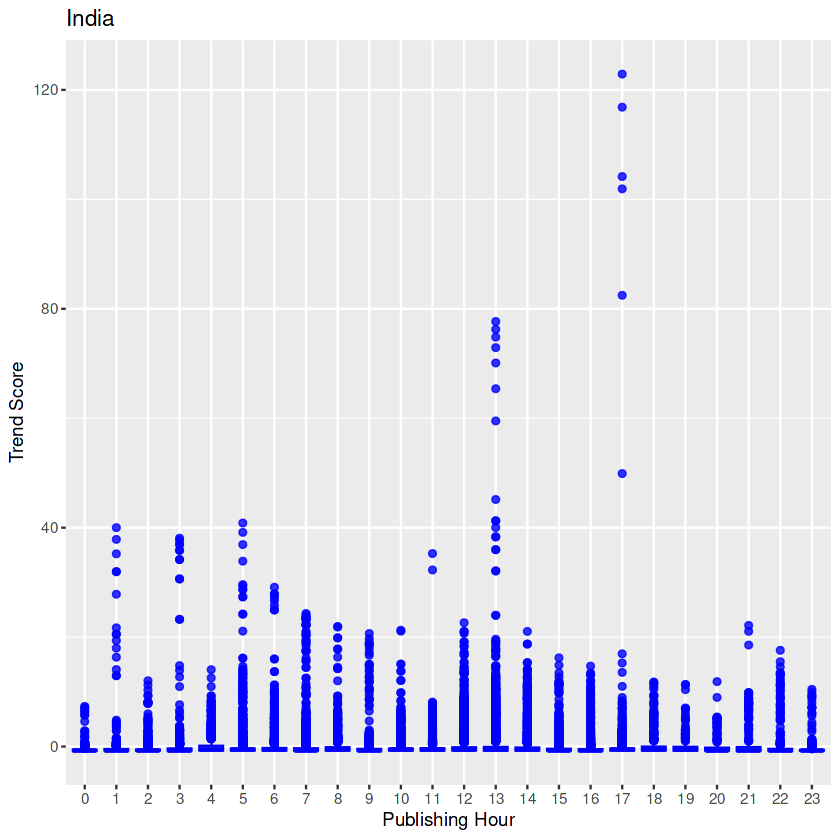

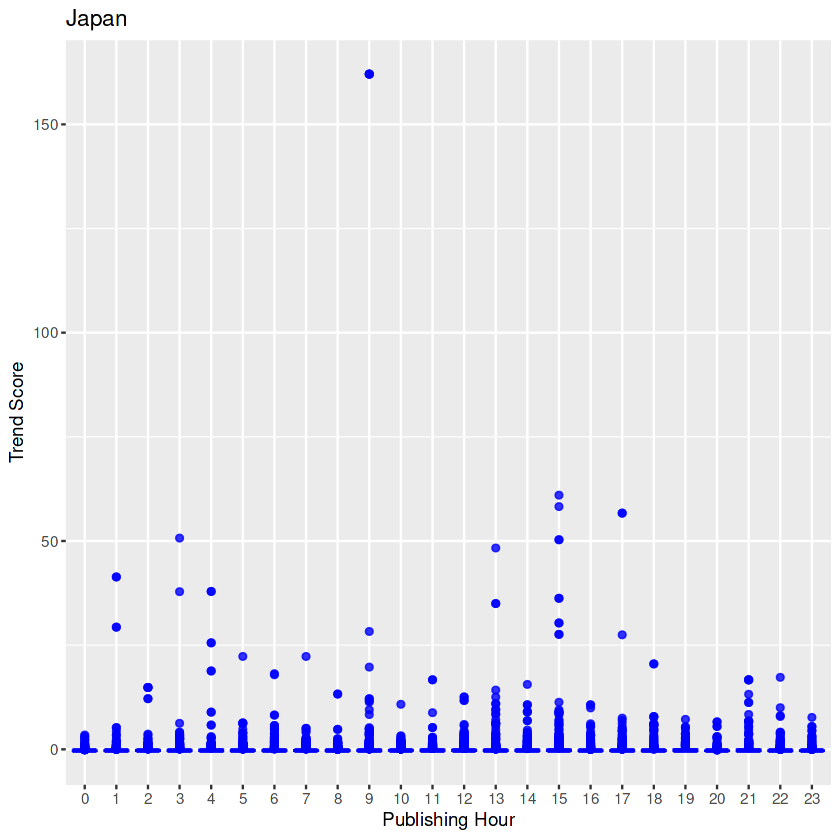

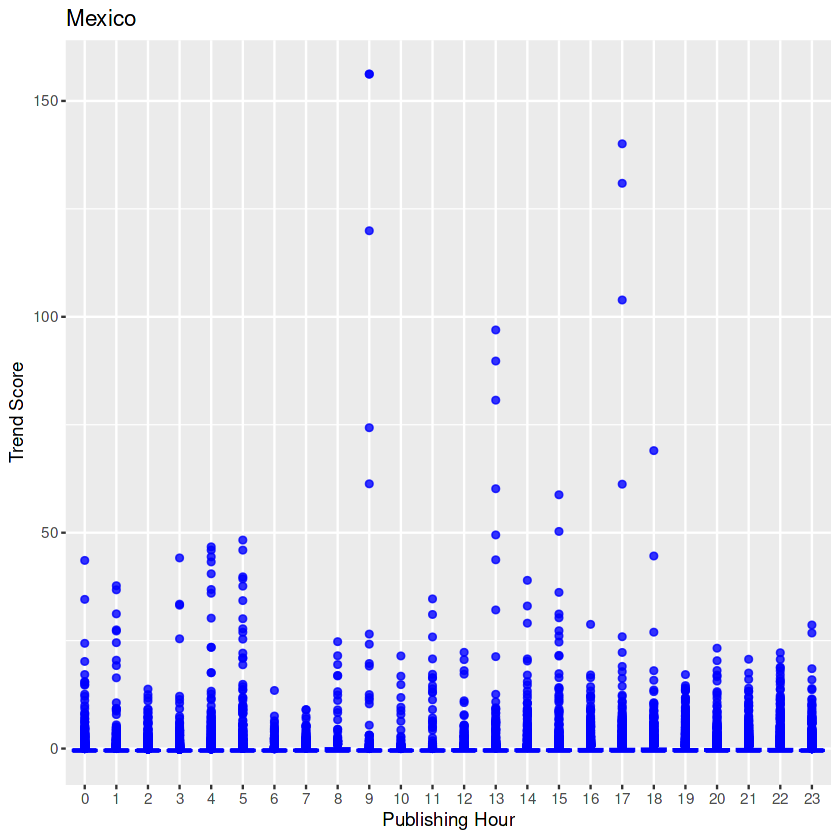

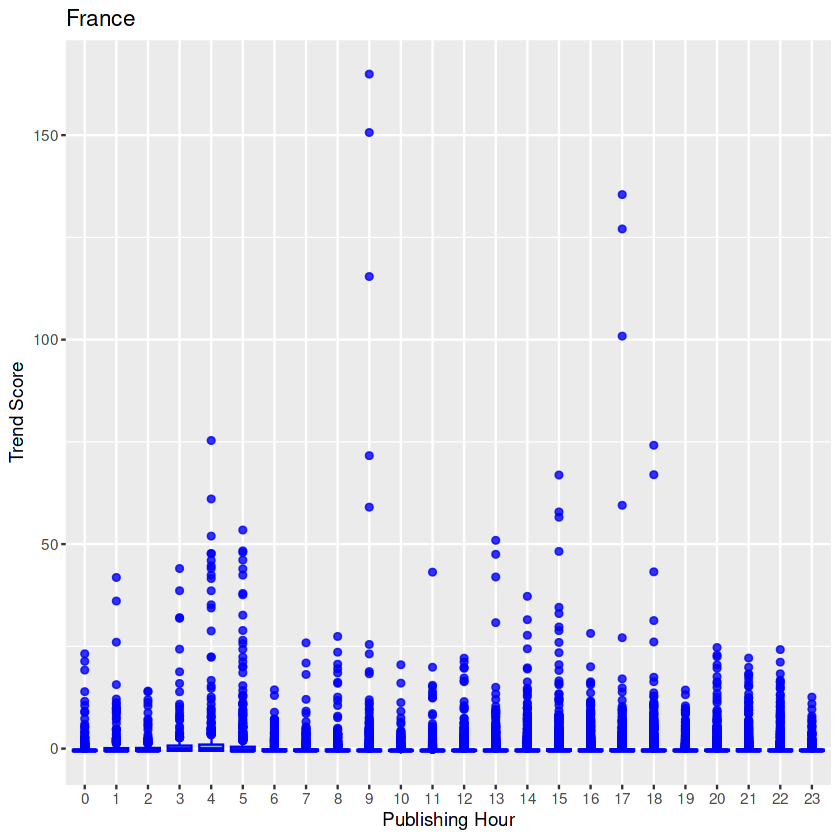

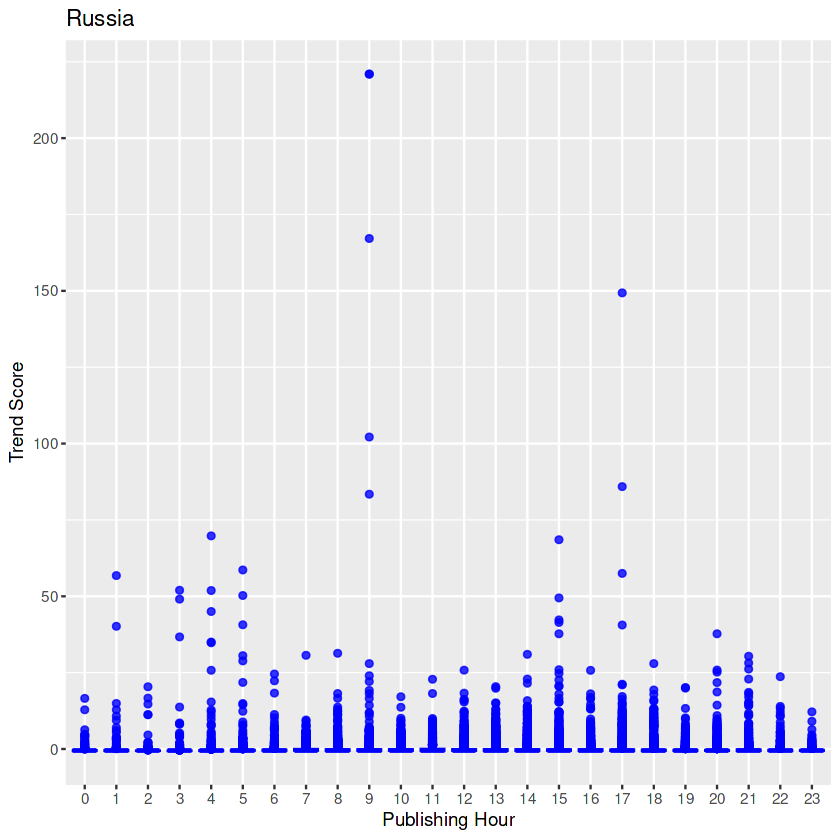

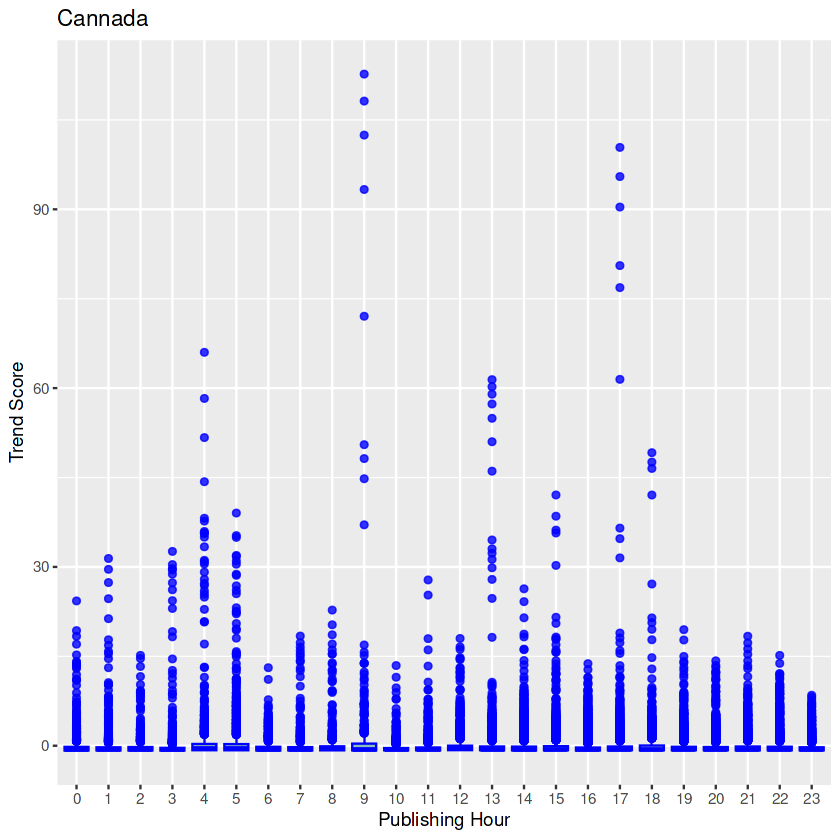

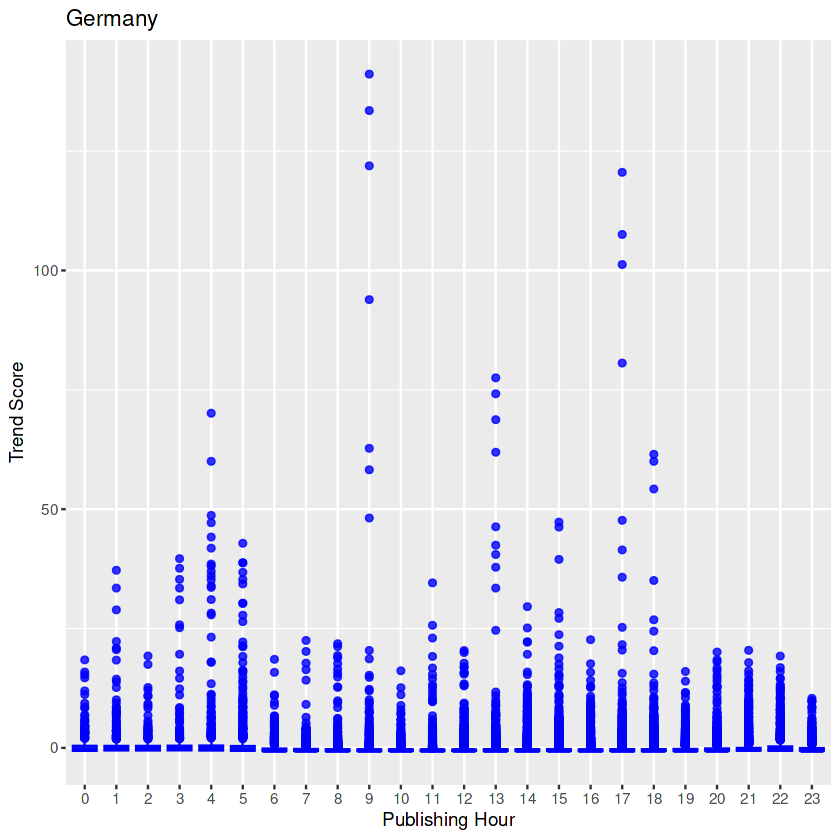

In [27]:
par(mfrow = c(1, 2))

Publish_Trend_Relation <- function(data, name) {
  plot <- ggplot(data, aes(x = factor(hour_of_day), y = trend_score)) +
    geom_boxplot(fill = "#69b3a2", color = "blue", alpha = 0.8) +
    labs(x = "Publishing Hour", y = "Trend Score") +
    ggtitle(name)
  
  plot(plot)
}

for (country in new_list) {
  data <- get(paste(country, sep = ""))
  name <- sub("\\.new$", "", country)
  Publish_Trend_Relation(data, name)
}


### Comment Disablity Effect on Popularity 

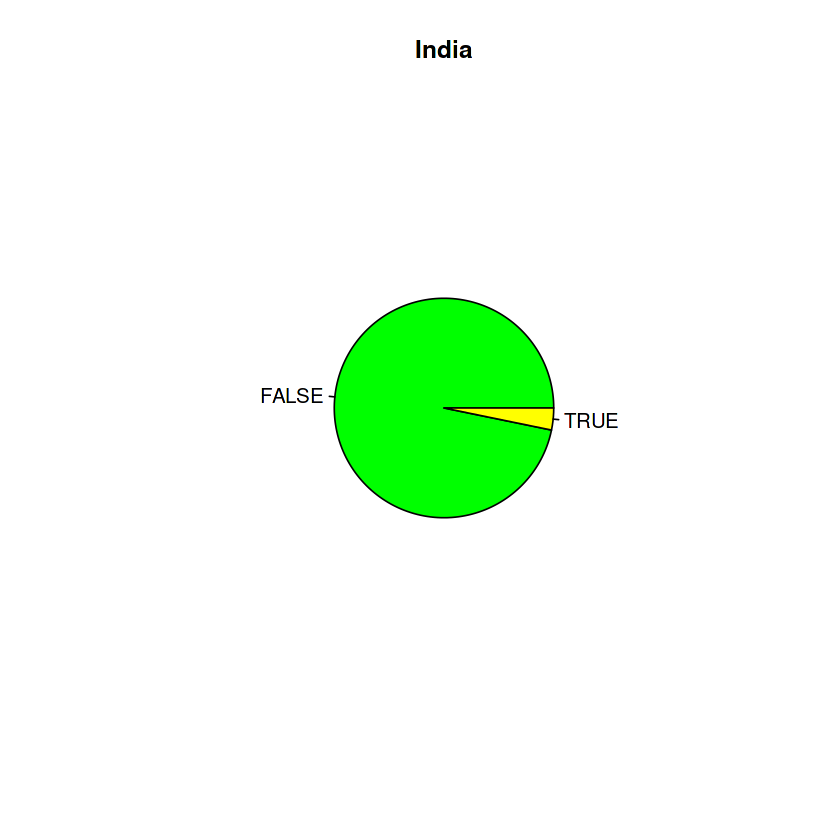

In [28]:
plot_comments_disabled <- function(country, country_name) {
  pie(table(country$comments_disabled), col = c("green","yellow"), main = paste0(country_name))
}

country = "India.new"
if (country %in% new_list) {
  data <- get(paste(country, sep = ""))
  name <- sub("\\.new$", "", country)
  plot_comments_disabled(data, name)
}

### Relationship of views and Categories

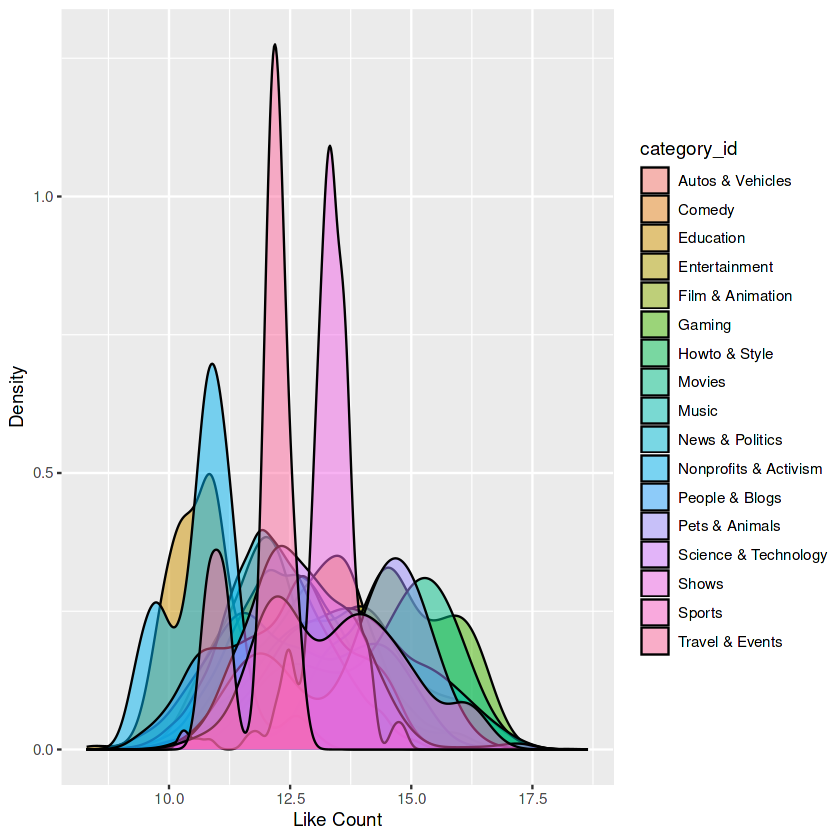

In [29]:
ggplot(India.new, mapping = aes(x = log(views), fill = category_id)) +
  geom_density(alpha = 0.5) +
  xlab("Like Count") +
  ylab("Density")

### Word Clouds of interesting words in titles

Loading required package: RColorBrewer



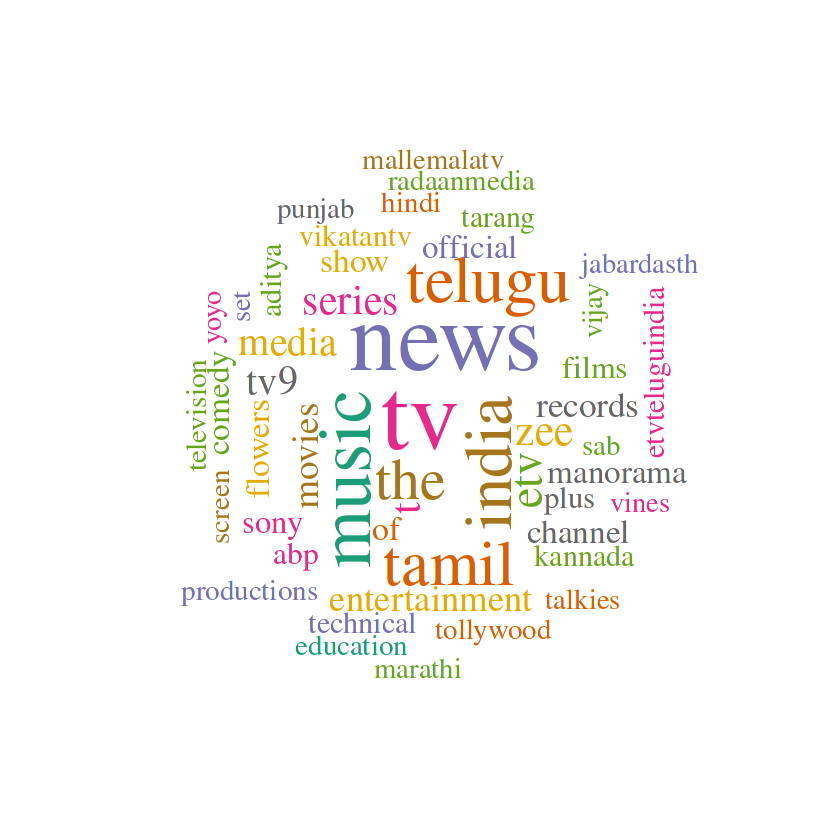

In [30]:
library(wordcloud)
create_interesting_word_cloud <- function(data) {
  corpus <- data %>%
    unnest_tokens(word, channel_title) %>%
    count(word, sort = TRUE) %>%
    head(60) 

  wordcloud(words = corpus$word, freq = corpus$n,
            scale = c(5, 1), min.freq = 1, max.words = 50,
            random.order = FALSE, rot.per = 0.25,
            colors = brewer.pal(8, "Dark2"),
            random.color = TRUE, 
            ordered.colors = FALSE,
            family = "Times",
            main = "Word Cloud of Channel Titles")
}

create_interesting_word_cloud(India.new)

### Correlation between variables


Attaching package: ‘reshape2’


The following object is masked from ‘package:tidyr’:

    smiths




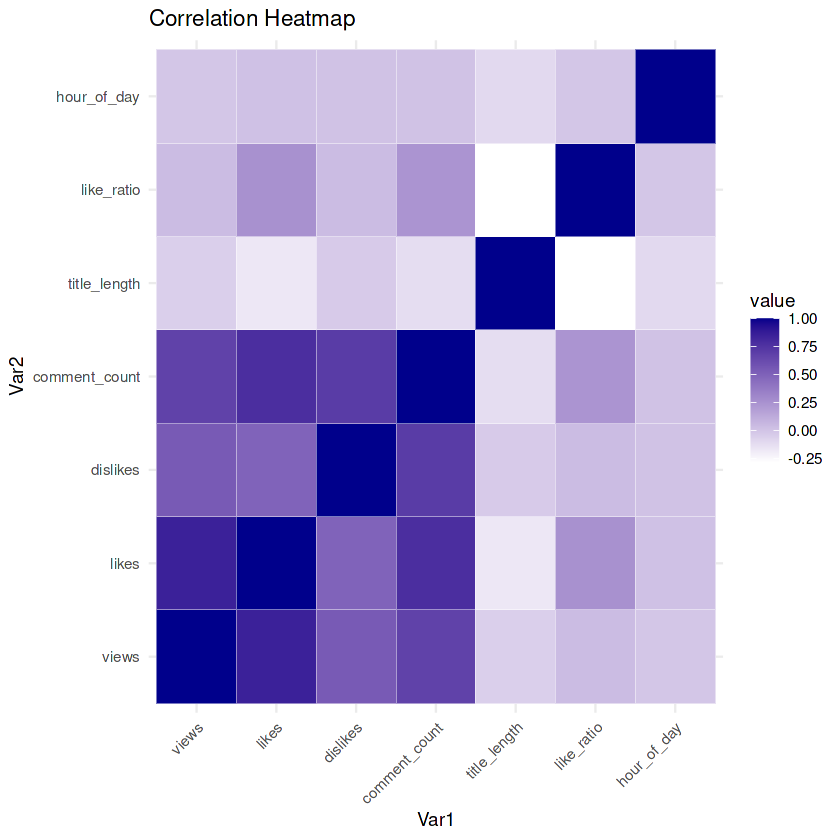

In [31]:
library(reshape2)

create_correlation_heatmap <- function(data, features) {
  # Subset the data for selected features
  data_subset <- data[, features]
  
  # Compute correlation matrix
  corr_matrix <- cor(data_subset)
  
  # Melt correlation matrix for plotting
  melted_data <- melt(corr_matrix)
  
  # Create heatmap using ggplot2
  heatmap <- ggplot(melted_data, aes(Var1, Var2, fill = value)) +
    geom_tile(color = "white") +
    scale_fill_gradient(low = "white", high = "darkblue") +
    labs(title = "Correlation Heatmap") +
    theme_minimal() +
    theme(axis.text.x = element_text(angle = 45, hjust = 1))
  
  print(heatmap)
}

features <- c( 'views', 'likes', 'dislikes', 'comment_count', 'title_length','like_ratio','hour_of_day')

create_correlation_heatmap(India.new, features)


### Pairwise Relation Between numeric variable

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2



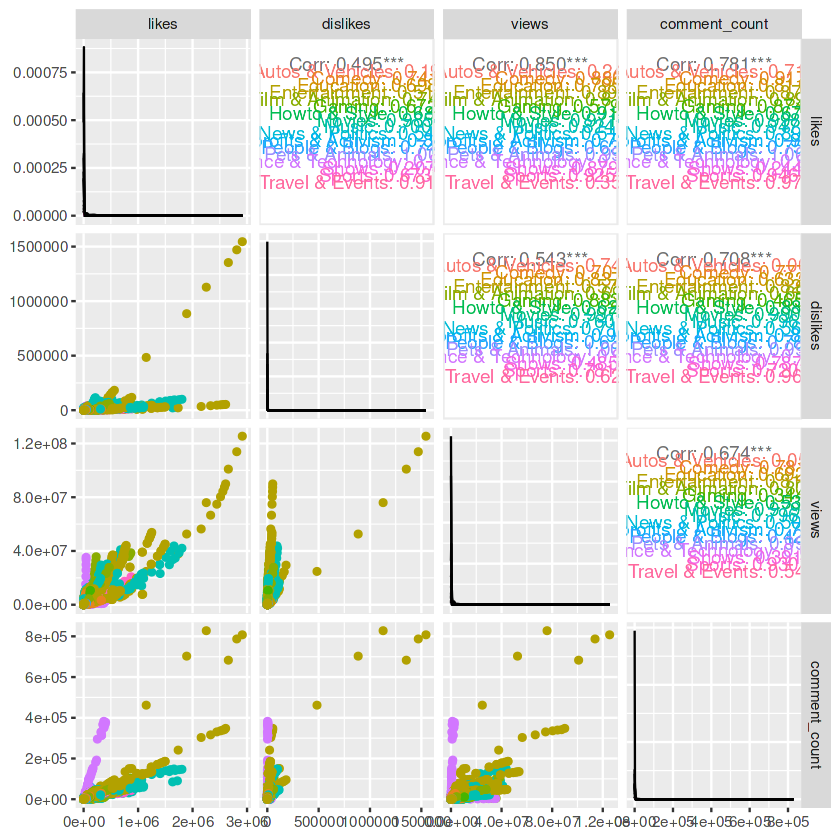

In [32]:
library(GGally)
ggpairs(India.new, columns = c("likes", "dislikes", "views", "comment_count"), mapping = aes(color = category_id))

### Engagement Rate By Category

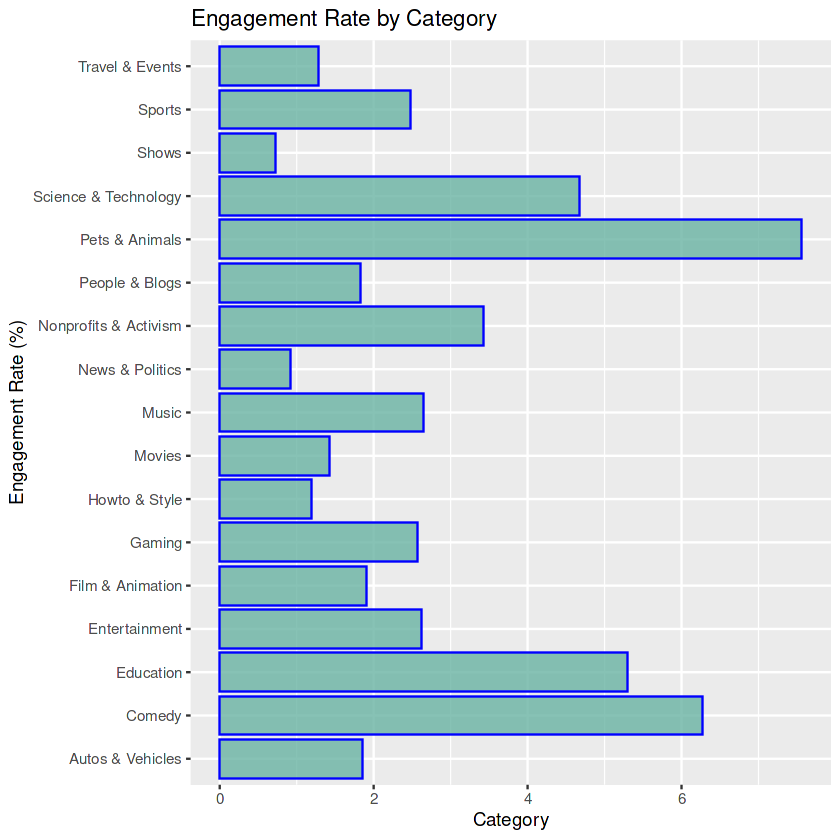

In [33]:
Engagement_Rate_By_Category <- function(data) {
  data <- data %>%
    group_by(category_id) %>%
    summarise(engagement_rate = sum(likes + dislikes) / sum(views) * 100)

  ggplot(data, aes(x = factor(category_id), y = engagement_rate)) +
    geom_bar(stat = "identity", fill = "#69b3a2", color = "blue", alpha = 0.8) +
    labs(x = "Engagement Rate (%)", y = "Category") +
    ggtitle("Engagement Rate by Category") +
    coord_flip()  # Tilt the graph to horizontal orientation
}

Engagement_Rate_By_Category(India.new)

### Most Viewed Category

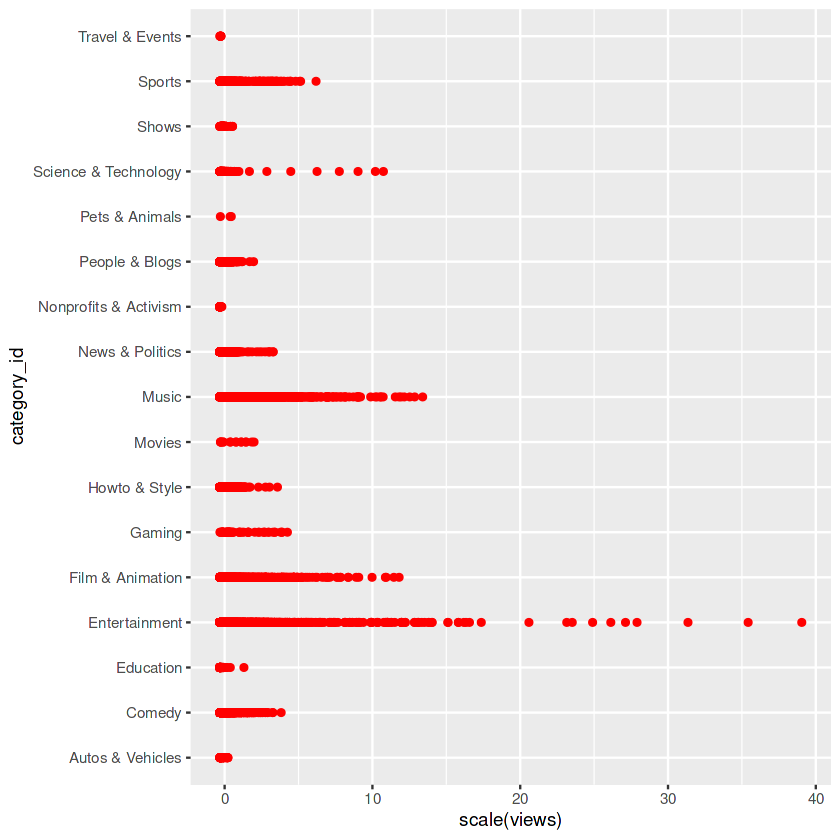

In [35]:
ggplot(India.new, mapping= aes(x =scale(views), y=category_id)) + geom_point(col="red")

### Observing the patterns and trends of video publishing activity throughout the day

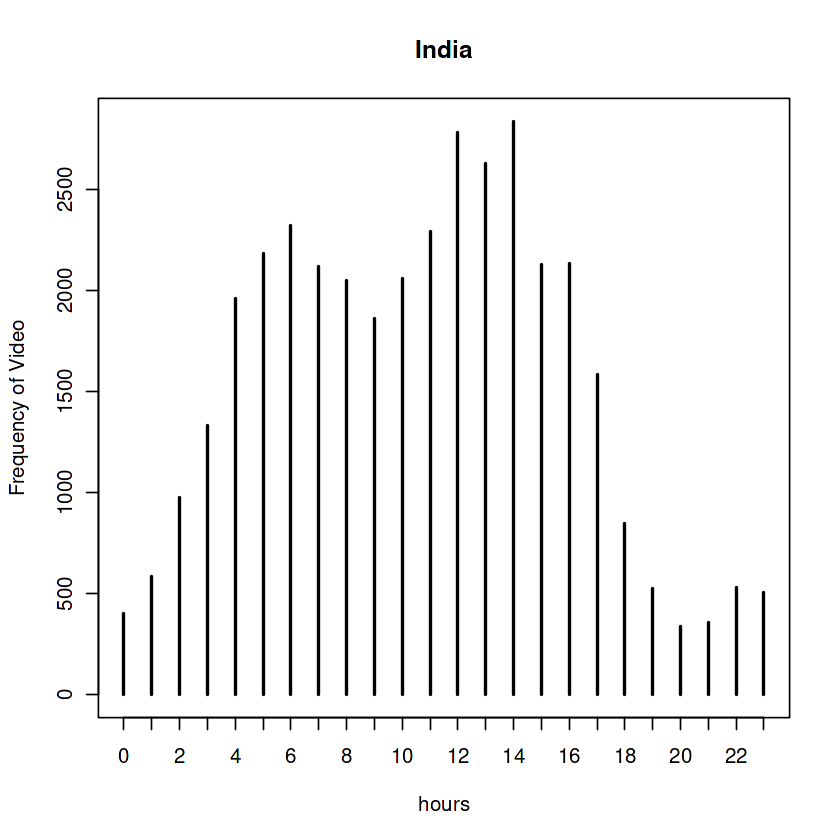

In [36]:
Publishing_pattern<-function(data,name){
    plot(table(data$hour_of_day), xlab = "hours" ,ylab="Frequency of Video", main=name)
}

Publishing_pattern(India.new,"India")

 ### Video Uploading Patterns throughout the week

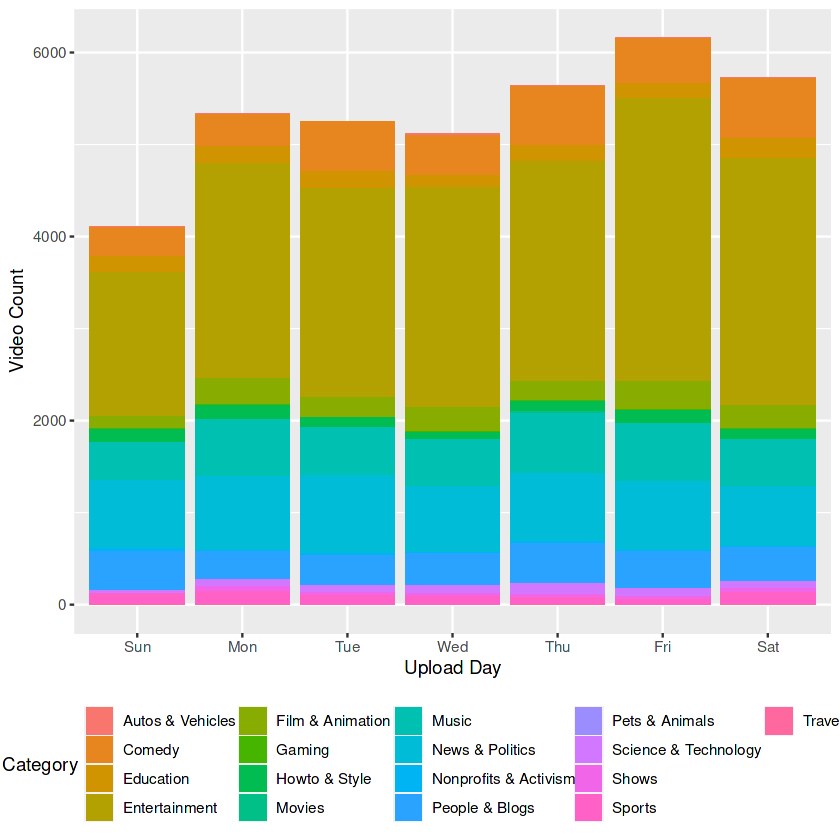

In [37]:
Video_upload_pattern<-function(data){
      ggplot(data, aes(x = factor(day_of_week), fill = category_id)) + 
      geom_bar() + 
      xlab("Upload Day") + 
      ylab("Video Count") + 
      theme(legend.position = "bottom") + 
      labs(fill = "Category") 
}
Video_upload_pattern(India.new)

### Pattern identification through clustering 

Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”
Warning message:
“did not converge in 10 iterations”


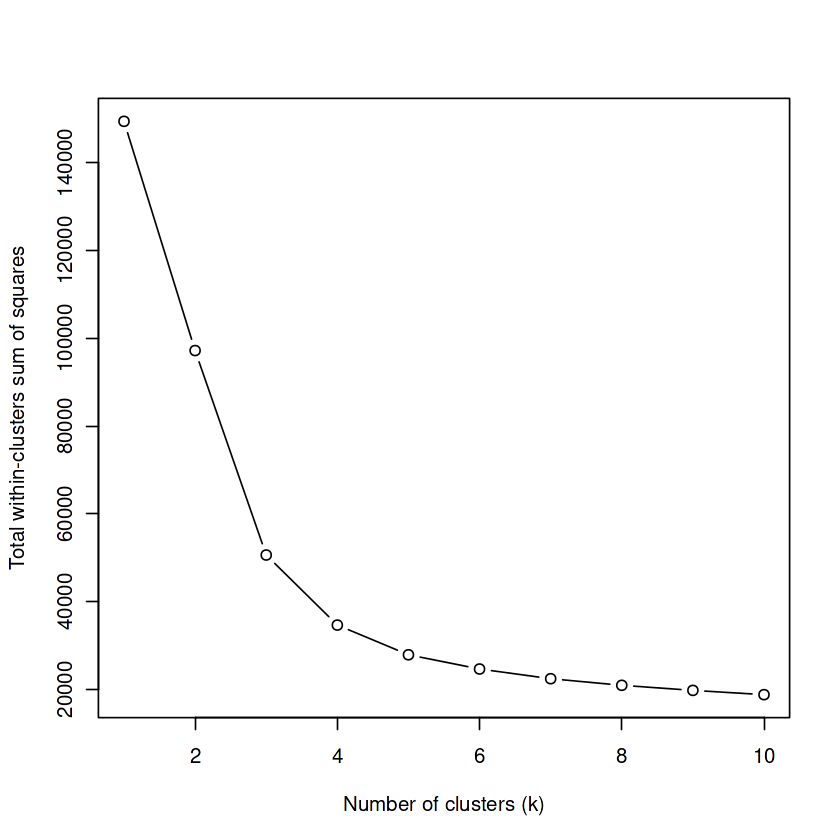

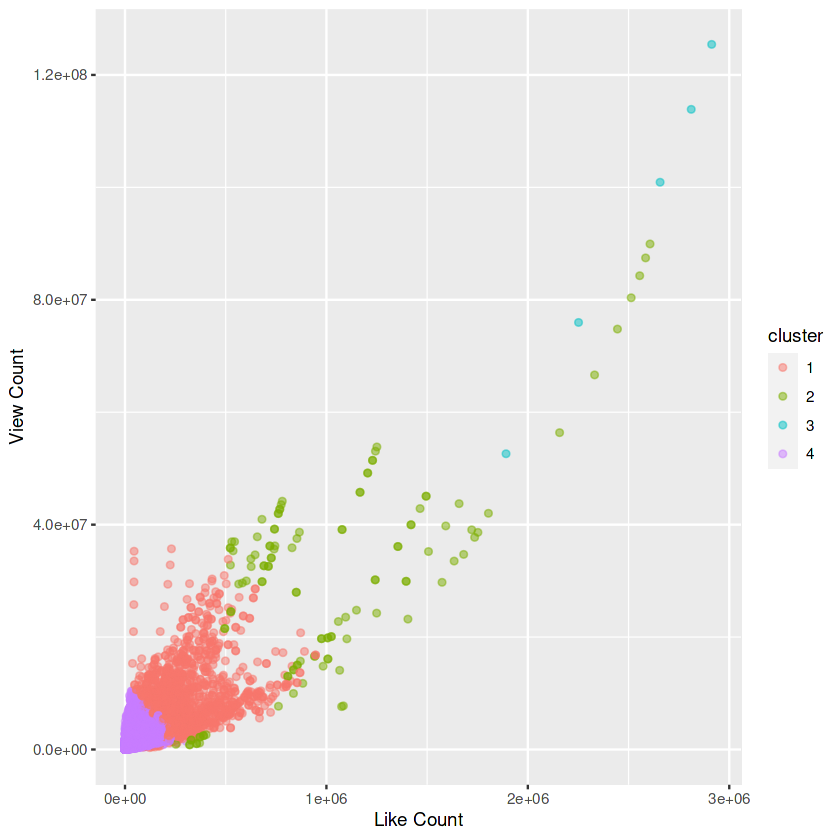

In [38]:
# Select the variables for clustering
cluster_vars <- India.new[, c("likes", "dislikes", "views", "comment_count")]

# Standardize the variables
scaled_vars <- scale(cluster_vars)

# Determine the optimal number of clusters using elbow method
wss <- sapply(1:10, function(k) {
  kmeans(scaled_vars, k, nstart=10)$tot.withinss
})

plot(1:10, wss, type="b", xlab="Number of clusters (k)", ylab="Total within-clusters sum of squares")

# Fit the K-means clustering model with optimal number of clusters
k <- 4
set.seed(123)
kmeans_model <- kmeans(scaled_vars, centers=k, nstart=25)

# Add the cluster labels to the original data frame
India.new$cluster <- as.factor(kmeans_model$cluster)

# Visualize the clusters
library(ggplot2)
ggplot(India.new, aes(x=likes, y=views, color=cluster)) + 
  geom_point(alpha=0.5) + 
  xlab("Like Count") + 
  ylab("View Count")

### Identifying Relationship using Clusters

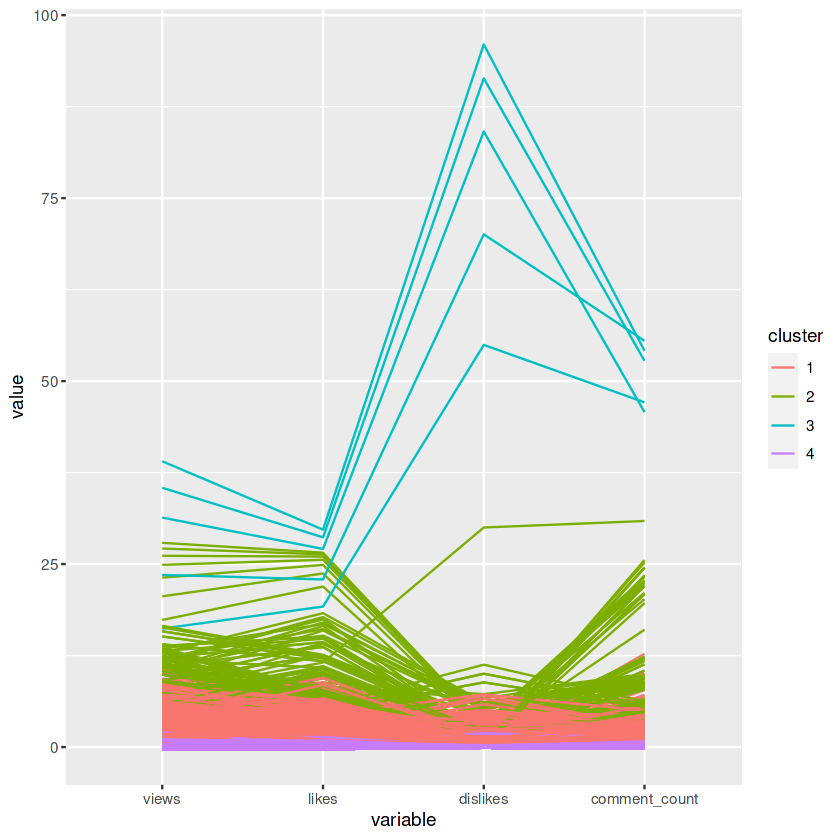

In [39]:
library(GGally)
ggparcoord(India.new, columns = c(8, 9, 10, 11), groupColumn = "cluster")

### Change in Views Over Time (Monthly)

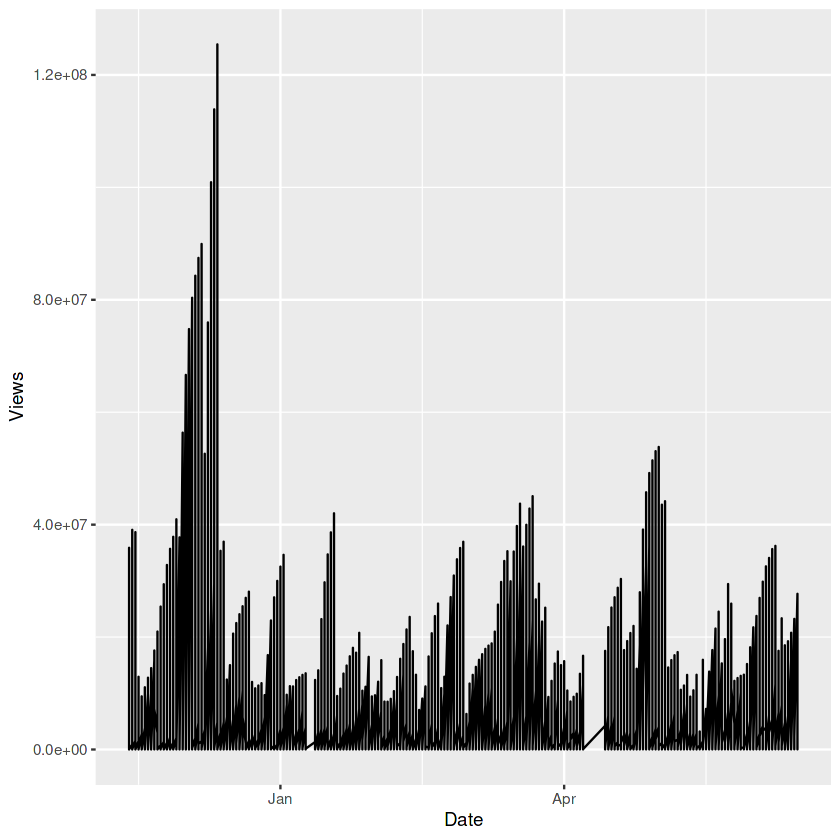

In [40]:
ggplot(India.new, aes(x = custom_trend_date, y = views)) +
  geom_line() +
  xlab("Date") +
  ylab("Views")

# MODEL BUILDING

### Linear Regression

In [41]:
# Read the AFINN-111.txt file line by line
sentiment_data <- readLines("/kaggle/input/helper/AFINN-111.txt")

# Process the lines to extract sentiment values
sentiment_values <- lapply(sentiment_data, function(line) {
  parts <- strsplit(line, "\t")[[1]]
  word <- parts[1]
  sentiment <- as.integer(parts[2])
  return(list(word = word, score = sentiment))
})

# Convert the list to a data frame
afinn_data <- do.call(rbind, sentiment_values)

Warning message in readLines("/kaggle/input/helper/AFINN-111.txt"):
“incomplete final line found on '/kaggle/input/helper/AFINN-111.txt'”


In [42]:
afinn_data <-as.data.frame(afinn_data)

In [43]:
library(textdata)

getSentimentLabel <- function(data) {
  
  # Tokenize the titles into individual words
  data$words <- lapply(data$title, function(title) unlist(strsplit(tolower(title), "\\W+")))
  
  # Perform sentiment analysis on each title
  data$sentiment_scores <- lapply(data$words, function(words) {
    sentiment_scores <- unlist(lapply(words, function(word) afinn_data$score[afinn_data$word == word]))
    sentiment_scores <- sentiment_scores[!is.na(sentiment_scores)]
    sum(sentiment_scores)
  })
  
  # Classify sentiment labels based on the total scores
  data$sentiment_label <- ifelse(data$sentiment_scores > 0, "Positive",
                                 ifelse(data$sentiment_scores < 0, "Negative", "Neutral"))
  
  return(data)
}

In [44]:
# Creating features for model..
generate_features <- function(data) {
  # Number of characters in title
  data$num_chars <- nchar(data$title)
  
  # Number of words in title
  data$num_words <- lengths(strsplit(data$title, " "))
  
  # Number of punctuation marks in title
  data$num_punctuation <- lengths(gregexpr("[[:punct:]]", data$title))
  
  # Number of uppercase words in title
  data$num_words_uppercase <- lengths(gregexpr("\\b[A-Z]+\\b", data$title))
  
  # Number of lowercase words in title
  data$num_words_lowercase <- lengths(gregexpr("\\b[a-z]+\\b", data$title))
  
  # Number of stopwords in title (assuming you have a stopwords list)
  stopwords <- c("the", "and", "of", "in", "to")  # Replace with your own stopwords list
  data$num_stopwords <- lengths(gregexpr(paste0("\\b", paste(stopwords, collapse = "\\b|\\b")), data$title, ignore.case = TRUE))
  
  # Average word length in title
  data$avg_word_len <- sapply(strsplit(data$title, " "), function(x) mean(nchar(x)))
  
  # Check if title contains digits
  data$contain_digits <- ifelse(grepl("\\d", data$title), 1, 0)
  
  # Check if title starts with digits
  data$startswith_digits <- ifelse(grepl("^\\d", data$title), 1, 0)
  
  # Views per day (assuming you have a 'views' and 'publish_time' column)
  data$views_per_day <- data$views / as.numeric(difftime(Sys.time(), as.POSIXct(data$publish_time, format = "%Y-%m-%dT%H:%M:%S.000Z"), units = "days"))
  
  # Return the updated data with the generated features
  return(data)
}

model_data <- generate_features(India.new)


In [45]:
model_data<- getSentimentLabel(model_data)

In [46]:
colnames(model_data)

[1] "video_id"               "trending_date"          "title"                 
 [4] "channel_title"          "category_id"            "publish_time"          
 [7] "tags"                   "views"                  "likes"                 
[10] "dislikes"               "comment_count"          "thumbnail_link"        
[13] "comments_disabled"      "ratings_disabled"       "video_error_or_removed"
[16] "description"            "title_length"           "custom_trend_date"     
[19] "custom_publish_time"    "like_ratio"             "dislike_percentage"    
[22] "hour_of_day"            "day_of_week"            "trend_score"           
[25] "cluster"                "num_chars"              "num_words"             
[28] "num_punctuation"        "num_words_uppercase"    "num_words_lowercase"   
[31] "num_stopwords"          "avg_word_len"           "contain_digits"        
[34] "startswith_digits"      "views_per_day"          "words"                 
[37] "sentiment_scores"       "sentiment_label"

In [47]:
new_feature <- function(df) {
  df$contain_upper <- ifelse(df$num_words_uppercase > 0, 1, 0)

  df$contain_lower <- ifelse(df$num_words_lowercase > 0, 1, 0)
  
  df$contain_punctuation <- ifelse(df$num_punctuation > 0, 1, 0)
  
  df$ratio_punctuation <- df$num_punctuation / df$num_chars

  df$ratio_stopwords <- df$num_stopwords / df$num_words

  df$is_shorts <- ifelse(grepl("#shorts", df$title), 1, 0)

  df$is_question <- ifelse(grepl("\\?", df$title), 1, 0)
  
  return(df)
}

model_data <- new_feature(model_data)

# Train-Test Split

In [53]:
head(model_data) 

,video_id,trending_date,title,channel_title,category_id,publish_time,tags,views,likes,dislikes,⋯,words,sentiment_scores,sentiment_label,contain_upper,contain_lower,contain_punctuation,ratio_punctuation,ratio_stopwords,is_shorts,is_question
,<chr>,<chr>,<chr>,<chr>,<chr>,<dttm>,<chr>,<dbl>,<dbl>,<dbl>,⋯,<list>,<list>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,kzwfHumJyYc,17.14.11,Sharry Mann: Cute Munda ( Song Teaser) | Parmish Verma | Releasing on 17 November,Lokdhun Punjabi,Film & Animation,2017-11-12 12:20:39,"sharry mann|""sharry mann new song""|""sharry mann cute munda""|""sharry mann latest song""|""sharry mann punjabi song 2017""|""parmish verma""|""parmish verma new song""|""parmish verma sharry mann""|""parmish verma sharry mann new song""|""parmish verma cute munda""|""new punjabi song 2017""|""punjabi song 2017""|""parmish verma new song 2017""|""parmish verma latest song 2017""|""punjabi songs 2017""",1096327,33966,798,⋯,"sharry , mann , cute , munda , song , teaser , parmish , verma , releasing, on , 17 , november",2,Positive,1,1,1,0.06172840,0.06666667,0,0
2,zUZ1z7FwLc8,17.14.11,"पीरियड्स के समय, पेट पर पति करता ऐसा, देखकर दंग रह जायेंगे",HJ NEWS,News & Politics,2017-11-13 05:43:56,"पीरियड्स के समय|""पेट पर पति करता ऐसा""|""देखकर दंग रह जायेंगे""|""latest news""|""today news""|""news""|""breaking news""|""current news""|""world news""|""hj news updates""|""bollywood updates""|""news channel in hindi""|""entertainment news""|""merrage""|""love""|""break up""|""perideus time""|""pragenent girl""|""baby born""",590101,735,904,⋯,"पीरियड, स , के , समय , पेट , पर , पति , करता , ऐसा , देखकर , दंग , रह , जायेंगे",0,Neutral,1,1,1,0.05172414,0.08333333,0,0
3,10L1hZ9qa58,17.14.11,Stylish Star Allu Arjun @ ChaySam Wedding Reception | TFPC,TFPC,Entertainment,2017-11-12 15:48:08,"Stylish Star Allu Arjun @ ChaySam Wedding Reception|""Stylish Star Allu Arjun""|""ChaySam Wedding Reception""|""nagachaitanya""|""samantha""|""chaysam""|""chay sam""|""naga chaitanya and samantha wedding reception""|""wedding reception""|""nagarjuna""|""akkineni wedding reception""|""tfpc""|""telugu cinema""|""celebrities @ chaysam wedding reception""",473988,2011,243,⋯,"stylish , star , allu , arjun , chaysam , wedding , reception, tfpc",0,Neutral,1,1,1,0.03448276,0.10000000,0,0
4,N1vE8iiEg64,17.14.11,Eruma Saani | Tamil vs English,Eruma Saani,Comedy,2017-11-12 07:08:48,"Eruma Saani|""Tamil Comedy Videos""|""Films""|""Movies""|""Harija""|""Short""|""Film""|""Eruma Sani""|""Eruma Saani Videos""|""Eruma Saani Short Film""|""Eruma Saani Comedy""|""Eruma Saani Harija""|""Eruma Saani Tamil vs English""|""Tamil vs English""|""Tamil""|""English""|""Hindi""|""TTV Dinakaran""|""Sasikala""|""Sasikala income tax raid""",1242680,70353,1624,⋯,"eruma , saani , tamil , vs , english",0,Neutral,1,1,1,0.03333333,0.16666667,0,0
5,kJzGH0PVQHQ,17.14.11,why Samantha became EMOTIONAL @ Samantha naga chaithanya marriage Reception | Filmylooks,Filmylooks,Entertainment,2017-11-13 01:14:16,"Filmylooks|""latest news""|""telugu movies""|""telugu news""|""Tollywood news""|""why Samantha became EMOTIONAL @ Samantha naga chaithanya marriage Reception""|""why Samantha became EMOTIONAL""|""samantha emotional moment""|""ChaySam Wedding Reception video""|""Naga Chaitanya and Samantha Wedding Reception LIVE""|""samantha ruth prabhu""",464015,492,293,⋯,"why , samantha , became , emotional , samantha , naga , chaithanya, marriage , reception , filmylooks",0,Neutral,1,1,1,0.02272727,0.08333333,0,0
6,il_pSa5l98w,17.14.11,"MCA (Middle Class Abbayi) TEASER - Nani,Sai Pallavi, Dil Raju, Devi Sri Prasad, Sriram Venu",Dil Raju,Entertainment,2017-11-10 04:29:50,"Nenu Local|""Nenu Local Telugu Movie""|""Nani""|""Sai Pallavi""|""Dil Raju""|""Devi Sri Prasad""|""Telugu Latest Movies""|""Telugu Full Movies""|""Telugu Comedy Movies""|""Nani Trailer""|""Nani Movies""|""MCA MOVIE""|""Middle Class Abbayi""|""MCA""|""MCA - Middle class abbayi""|""Fidaa""|""Nani MCA""|""MCA Trailer""|""MCA Teaser""|"

In [65]:
model_data$sentiment_scores<-as.integer(model_data$sentiment_scores)

In [104]:
features <- data.frame(
  views_per_day = model_data$views_per_day,
  num_chars = model_data$num_chars,
  num_words = model_data$num_words,
  num_punctuation = model_data$num_punctuation,
  num_words_uppercase = model_data$num_words_uppercase,
  num_words_lowercase = model_data$num_words_lowercase,
  num_stopwords = model_data$num_stopwords,
  avg_word_len = model_data$avg_word_len,
  contain_digits = model_data$contain_digits,
  startswith_digits = model_data$startswith_digits,
  scores = model_data$sentiment_scores,
  contain_upper = model_data$contain_upper,
  contain_lower = model_data$contain_lower,
  contain_punctuation = model_data$contain_punctuation,
  ratio_punctuation = model_data$ratio_punctuation,
  ratio_stopwords = model_data$ratio_stopwords,
  is_shorts = model_data$is_shorts,
  is_question =model_data$is_question
)

In [106]:
head(features)

,views_per_day,num_chars,num_words,num_punctuation,num_words_uppercase,num_words_lowercase,num_stopwords,avg_word_len,contain_digits,startswith_digits,scores,contain_upper,contain_lower,contain_punctuation,ratio_punctuation,ratio_stopwords,is_shorts,is_question
,<dbl>,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,529.2045,81,15,5,1,1,1,4.466667,1,0,2,1,1,1,0.06172840,0.06666667,0,0
2,284.9454,58,12,3,1,1,1,3.916667,0,0,0,1,1,1,0.05172414,0.08333333,0,0
3,228.8131,58,10,2,1,1,1,4.900000,0,0,0,1,1,1,0.03448276,0.10000000,0,0
4,599.7874,30,6,1,1,1,1,4.166667,0,0,0,1,1,1,0.03333333,0.16666667,0,0
5,224.0413,88,12,2,1,5,1,6.416667,0,0,0,1,1,1,0.02272727,0.08333333,0,0
6,2944.4233,91,15,7,2,1,1,5.133333,0,0,0,1,1,1,0.07692308,0.06666667,0,0


In [107]:
# Drop the 'views_per_day' column from the dataframe
X <- subset(features, select = -c(views_per_day))

# Extract the 'views_per_day' column as the response variable
Y <- features$views_per_day

# Create the 'divide' variable
divide <- ifelse(features$views_per_day > 5 * mean(model_data$views_per_day), "High", "Low")

# Set the seed for reproducibility
set.seed(123)

# Create a vector of indices
indices <- 1:nrow(features)

# Split the indices into train and test indices
train_indices <- sample(indices, size = 0.7 * length(indices), replace = FALSE,
                        prob = ifelse(divide == "High", 0.7, 0.3))
test_indices <- setdiff(indices, train_indices)

# Create the train and test datasets
X_train <- X[train_indices, ]
X_test <- X[test_indices, ]
y_train <- Y[train_indices]
y_test <- Y[test_indices]

# Print the number of rows in train and test datasets
cat("Number of rows in train dataset:", nrow(X_train), "\n")
cat("Number of rows in test dataset:", nrow(X_test), "\n")


Number of rows in train dataset: 26146 
Number of rows in test dataset: 11206 


In [108]:
sapply(features , function(x)  is.numeric(x))

views_per_day           num_chars           num_words     num_punctuation 
               TRUE                TRUE                TRUE                TRUE 
num_words_uppercase num_words_lowercase       num_stopwords        avg_word_len 
               TRUE                TRUE                TRUE                TRUE 
     contain_digits   startswith_digits              scores       contain_upper 
               TRUE                TRUE                TRUE                TRUE 
      contain_lower contain_punctuation   ratio_punctuation     ratio_stopwords 
               TRUE                TRUE                TRUE                TRUE 
          is_shorts         is_question 
               TRUE                TRUE

In [117]:
head(X_train)

,num_chars,num_words,num_punctuation,num_words_uppercase,num_words_lowercase,num_stopwords,avg_word_len,contain_digits,startswith_digits,scores,contain_upper,contain_lower,contain_punctuation,ratio_punctuation,ratio_stopwords,is_shorts,is_question
,<int>,<int>,<int>,<int>,<int>,<int>,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
9354,55,12,4,1,1,1,3.666667,1,0,0,1,1,1,0.07272727,0.08333333,0,0
29034,91,18,4,1,1,1,4.111111,0,0,0,1,1,1,0.04395604,0.05555556,0,0
14126,81,13,10,1,1,1,5.307692,1,0,0,1,1,1,0.12345679,0.07692308,0,0
32756,46,9,2,1,1,1,4.222222,0,0,0,1,1,1,0.04347826,0.11111111,0,0
35014,93,13,9,1,1,1,6.230769,0,0,0,1,1,1,0.09677419,0.07692308,0,0
6141,51,8,3,1,1,1,5.500000,0,0,3,1,1,1,0.05882353,0.12500000,0,0


In [121]:
y_train <- scale(y_train, center = min(y_train), scale = max(y_train) - min(y_train))
head(y_train)

0.0008724833
0.0032152499
0.0200834722
0.0096126585
0.0061802897
0.0479096762


In [136]:
library(lightgbm)

# Convert data to matrix
train_data <- lgb.Dataset(data = as.matrix(X_train),
                          label = as.vector(y_train))



In [138]:
# parameters
params <- list(objective = "regression",
               metric = "mse",
               nrounds = 100,
               seed = 123)



In [140]:
# Train the model
gbm <- lgb.train(params = params,
                 data = train_data,
                 valids = list(test = lgb.Dataset(data = as.matrix(X_test), label = as.vector(y_test))),
                 early_stopping_rounds = 10)



[1]:	test's l2:888880 
[2]:	test's l2:888879 
[3]:	test's l2:888879 
[4]:	test's l2:888879 
[5]:	test's l2:888878 
[6]:	test's l2:888878 
[7]:	test's l2:888878 
[8]:	test's l2:888877 
[9]:	test's l2:888877 
[10]:	test's l2:888877 


In [145]:
# Predict on the training set
pred_y = predict(gbm, X_test) 
head(pred_y)

[1] 0.009424509 0.009459220 0.010038989 0.008244167 0.009160643 0.005690907

In [147]:
mse = mean((y_test - pred_y)^2)
mae = caret::MAE(y_test, pred_y)
rmse = caret::RMSE(y_test, pred_y)

cat("MSE: ", mse, "\nMAE: ", mae, "\nRMSE: ", rmse)

MSE:  888876.7 
MAE:  351.2779 
RMSE:  942.8026

In [154]:
data<- list()
data$pred_y<-pred_y
data$y_test <- y_test
data<-as.data.frame(data)
head(data)
dim(data)

,pred_y,y_test
,<dbl>,<dbl>
1,0.009424509,529.20449
2,0.009459220,284.94541
3,0.010038989,467.68358
4,0.008244167,943.86741
5,0.009160643,85.19073
6,0.005690907,114.25560


[1] 11206     2

`geom_smooth()` using formula = 'y ~ x'


TableGrob (1 x 1) "arrange": 1 grobs
  z     cells    name           grob
1 1 (1-1,1-1) arrange gtable[layout]


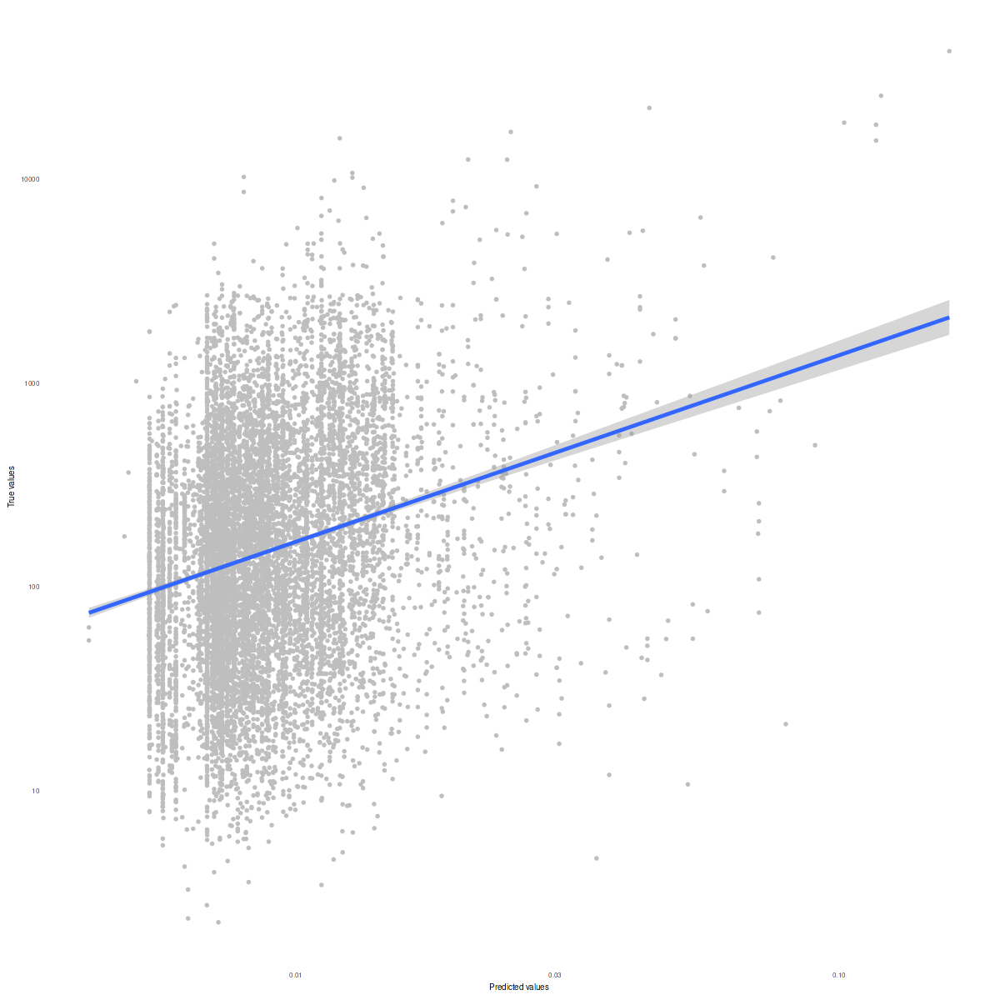

In [159]:
library(ggplot2)
library(gridExtra)

# Set figure options
options(repr.plot.width = 10, repr.plot.height = 10)

# Create the scatter plot
scatter_plot <- ggplot(data, aes(x = pred_y, y = y_test)) +
  geom_point(color = "grey", size = 0.5) +
  geom_smooth(method ="lm") +
  scale_x_log10() +
  scale_y_log10() +
  labs(x = "Predicted values", y = "True values") +
  theme_minimal() +
  theme(panel.grid = element_blank(),
        panel.border = element_blank(),
        axis.title = element_text(size = 5.5),
        axis.text = element_text(size = 4.5))

# Create the main plot with gridspec
main_plot <- grid.arrange(scatter_plot, ncol = 1, heights = c(4))

# Plot the main plot
print(main_plot)

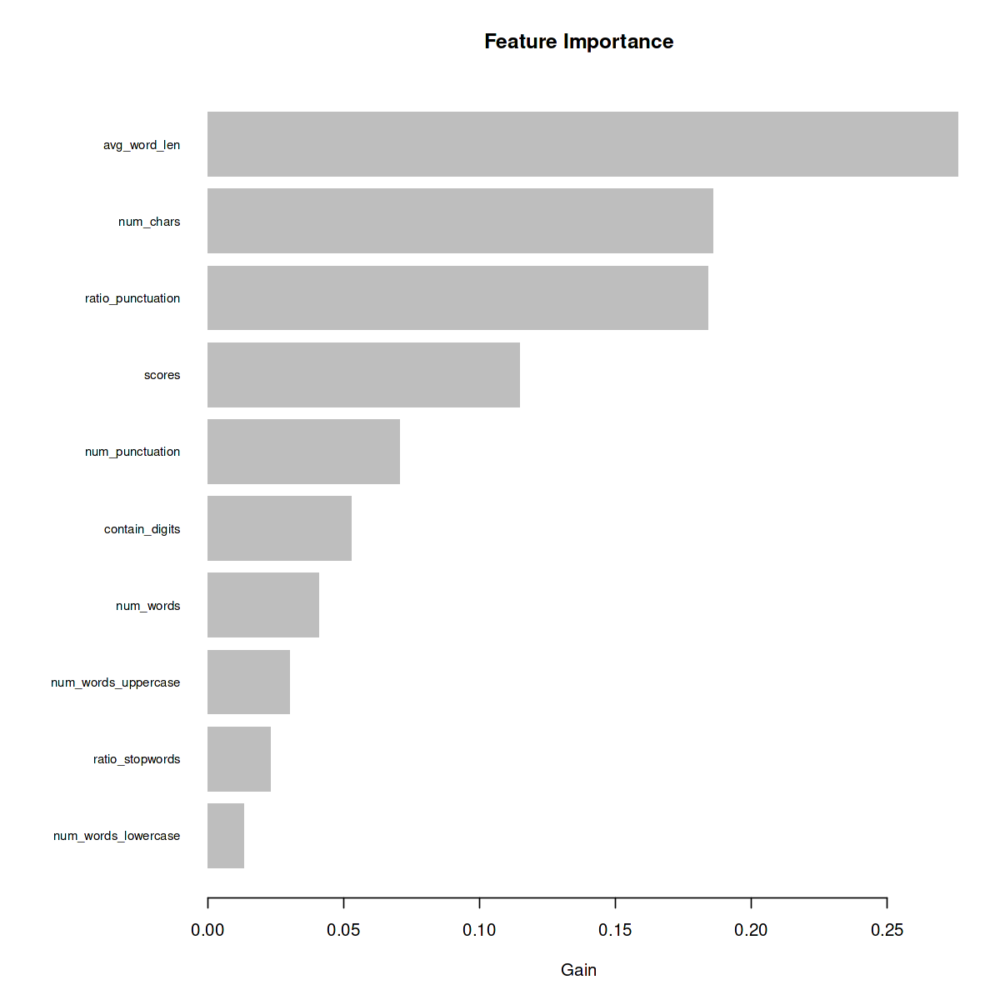

In [176]:
tree_imp <- lgb.importance(gbm, percentage = TRUE)
lgb.plot.importance(
  tree_imp,
  top_n = 10L,
  measure = "Gain",
  left_margin = 10L,
  cex = NULL
)
